In [1]:
import IPython.core.display
import subprocess
import os
import pathlib
import itertools
import string
import numpy as np
import pandas as pd
import copy
import Bio
import Bio.SeqRecord
import Bio.Seq
import Bio.SeqFeature
import pydna
import pydna.editor
import pydna.primer
import pydna.dseqrecord
import pydna.amplify
import pydna.assembly
import pydna.gel
import pydna.ladders
from pydna.dseqrecord import Dseqrecord



In [2]:
#path = os.path.abspath(os.getcwd())
#path_for_utils = '../'
#os.chdir(path_for_utils)
#os.path.abspath(os.getcwd())
##import constrain.constrain
#import src.data.utils as utils
#from src.data.utils import bioimager, imagingStation, nanophotometer, figures
#os.chdir(path)
#os.path.abspath(os.getcwd())

In [175]:
##function list
def amplicon_by_name(name, amplicons_lst):
    """Extract the amplicon by name"""
    for amplicon in amplicons_lst:
        if amplicon.name == name:
            return amplicon
        
def mean(lst):
    """Get mean"""
    mean = sum(lst) / len(lst)
    return mean

def wanted_mass(wanted_moles, size):
    """
    wanted moles in nmol, 
    size in bp
    
    Returns:
    in ng = nmol * bp * 650 ng/(nmol * bp)
    
    """
    w_mass = wanted_moles * size * 650
    w_mass_rounded = round(w_mass,1)
    return(w_mass_rounded)

def wanted_volume(wanted_mass, actual_concentration):
    """
    wanted mass in ng
    actual_concentration in ng/ul
    return in ul
    """
    wanted_volume = wanted_mass / actual_concentration
    wanted_volume_rounded = round(wanted_volume,1)
    return(wanted_volume_rounded)

# Debottlenecking the strictosidine module

## Hypothesis
1. Specific combinations of CPR / G8H homologs and corresponding expression levels can remove the G8H bottleneck in the Strictosidine pathway

### Aim: To test the hypothesis through library design

Tasks
1. analyse seq data from first library construction
2. **2nd Library**
    - investigate parts already in the lab
    - create parts missing
    - pool together parts
    - transformation
4. Phenotyping
5. Data analysis

# Intro

The purpose of this notebook is to create a smaller library based on a machine learning prediction of the highest producing combination of genes from combinations seen in the figure below. 

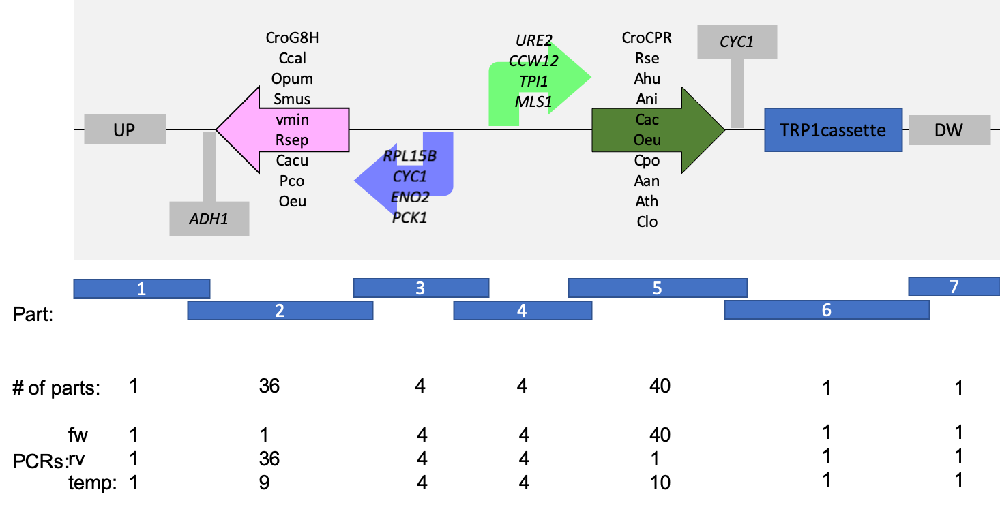

In [4]:
IPython.core.display.Image('../pictures/library_design_1.png', width=600)

The figure above illustrates the original library design. Note that G8H Pco
was not available, lowering G8H parts to 8. 

Note on sequence homology: 
- As G8H and CPR parts have homology this library cannot be made in one-pot transformation. Instead it is made in 9*10 individual transformation to not add two G8H or CPR homologs in one transformation mixtures.

Machine learning pred:
- In the following, the machine learning outcome can be found. It was found that 140 strains (5*2*2*7)was suitable for the pupose.
- From the predictions, the following genes have been selected: 
    - Smus, Vmin, Cro, Rsep, Oeu
    - pCYC1, pENO2
    - Clo, Ara, Rse, Aan, Cro, Ani, Ahu
    - pTPI1, pCCW12

Experiment:
- To perform this experiment, a total of 35 (5*7) transformation should be performed 
- To perform this, each gene has several different overhangs and these are pooled together. All promoters are also pooled together. UP, DW and cTRP1 is pooled together. Then the correct mixes should be performed. 

The previous experiments were simulated in 05-SDP-AllLibraries, and the next step in the process was investigation of the machine learning outcome.

# Second sequencing

From the providede data to the first ML, some highproducers were missing sequencing data. Therefore, the top 20 producers missing sequencing data were sequenced again. 


How to check results
1. www.eurofinsgenomics.eu
2. USER: DNAsequencing@biosustain.dtu.dk; Passw: mhUTVHs3
3. My Kits & Labels
4. Search box ID eg. SA00221327


Example
box
code
row
col
sample
primer
date submitted
result
comment

 Those missing: 
 CPR
 strain               plate well  Amt_norm_me control g8h   pg8h   pcpr  cpr   ML   
 1 HA-33_D03_Smus Ara_3 yp50  D03        277.   no      Smus  ENO2   <NA>  Ara   no   
 2 HA-45_G03_Rsep Rse_3 yp50  G03        177.   no      Rsep  ENO2   <NA>  Rse   no   
 3 HA-81_A02_Oeu Cro_2  yp51  A02        141.   no      Oeu   ENO2   <NA>  Cro   no   
 4 HA-81_A01_Oeu Cro_1  yp51  A01        127.   no      Oeu   ENO2   <NA>  Cro   no   
 5 HA-44_F10_Rsep Clo_1 yp50  F10        114.   no      Rsep  ENO2   <NA>  Clo   no   
 6 HA-34_D05_Smus Clo_2 yp50  D05         93.9  no      Smus  ENO2   <NA>  Clo   no   
 8 HA-39_E08_Smus Oeu_2 yp50  E08         82.0  no      Smus  CYC1   <NA>  Oeu   no   
 9 HA-38_E06_Smus Cac_3 yp50  E06         72.9  no      Smus  ENO2   <NA>  Cac   no   
10 HA-48_G10_Rsep Cac_1 yp50  G10         62.5  no      Rsep  ENO2   <NA>  Cac   no   
11 HA-82_A06_Oeu Aan_3  yp51  A06         37.8  no      Oeu   CYC1   <NA>  Aan   no   
14 HA-83_A08_Oeu Ara_2  yp51  A08         14.0  no      Oeu   CYC1   <NA>  Ara   no   
15 HA-32_C12_Smus Aan_3 yp50  C12         13.3  no      Smus  RPL15B <NA>  Aan   no   
16 HA-23_A07_Vmin Ara_1 yp50  A07         10.3  no      Vmin  RPL15B <NA>  Ara   no   
17 HA-42_F04_Rsep Aan_1 yp50  F04          9.92 no      Rsep  CYC1   <NA>  Aan   no   
18 HA-76_G04_Cro Ahu_1  yp49  G04          4.26 no      Cro   ENO2   <NA>  Ahu   no   
19 HA-24_A12_Vmin Clo_3 yp50  A12          3.63 no      Vmin  RPL15B <NA>  Clo   no   
20 HA-82_A05_Oeu Aan_2  yp51  A05          3.57 no      Oeu   RPL15B <NA>  Aan   no 
    17 CPR
    
G8H  
7 HA-39_E07_Smus Oeu_1 yp50  E07         85.6  no      Smus  <NA>   TPI1  Oeu   no 
12 HA-43_F09_Rsep Ara_3 yp50  F09         29.6  no      Rsep  <NA>   TPI1  Ara   no   
13 HA-42_F05_Rsep Aan_2 yp50  F05         15.2  no      Rsep  <NA>   URE2  Aan   no  
    3 G8H

CPR
1. yp49  G04
2.  yp50  A07
3. yp50  A12
4. yp50  C12
5. yp50  D03
6. yp50  D05 
7. yp50  E06
8. yp50  E08
9. yp50  F04 
10. yp50  F10
11. yp50  G03
12. yp50  G10
13. yp51  A01
14. yp51  A02
15. yp51  A05
16. yp51  A06
17. yp51  A08
18. H2O

G8H

19. yp50 E07
20. yp50 F05
21. p50  F09
22. H2O


In [5]:
from Bio import SeqIO
##Import primers for amplification
pad_pG8H_fw2  = Dseqrecord('AGACAGGTCCATACGCC')
tADH1_160_rv = Dseqrecord('GAAATTCGCTTATTTAGAAGTGTC')


pad_pCPR_fw2  = Dseqrecord('TGCCTTATCGAATGGGCA')
tCYC1_150_rv = Dseqrecord('CTCCTTCCTTTTCGGTTAGAG')


##Import a "dummy" strain.
HA2 = SeqIO.read('../data/HA2.fasta', 'fasta')


##Amplify G8H and CPR
G8H_amplicon = pydna.amplify.pcr(tADH1_160_rv, pad_pG8H_fw2, HA2)
CPR_amplicon = pydna.amplify.pcr(pad_pCPR_fw2, tCYC1_150_rv, HA2)


##Rename amplicons
G8H_amplicon.name = "HA21-100 G8H"
G8H_amplicon.annotations['batches'] = [{'location':"yp49-51"}]
CPR_amplicon.name = "HA21-100 CPR"
CPR_amplicon.annotations['batches'] = [{'location':"yp49-51"}]


G8H_amplicon.annotations['batches']

[{'location': 'yp49-51'}]

In [6]:
##Import primers for amplification
#pad_pG8H_fw2  = utils.from_benchling("pad_pG8H_fw2", 'Primer')
#tADH1_160_rv = utils.from_benchling("ADH1_test_fw", 'Primer') #224
#
#pad_pCPR_fw2  = utils.from_benchling("pad_pCPR_fw2", 'Primer')
#tCYC1_150_rv = utils.from_benchling("CYC1_test_rv", 'Primer') #225
#
##Import a "dummy" strain.
#HA2 = utils.from_benchling("MIA-HA-2")
#
##Amplify G8H and CPR
#G8H_amplicon = pydna.amplify.pcr(tADH1_160_rv, pad_pG8H_fw2, HA2)
#CPR_amplicon = pydna.amplify.pcr(pad_pCPR_fw2, tCYC1_150_rv, HA2)
#
##Rename amplicons
#G8H_amplicon.name = "HA21-100 G8H"
#G8H_amplicon.annotations['batches'] = [{'location':"yp49-51"}]
#CPR_amplicon.name = "HA21-100 CPR"
#CPR_amplicon.annotations['batches'] = [{'location':"yp49-51"}]

In [7]:
# workaround
tADH1_160_rv.annotations['batches'] = [{'location'    :'o3',
                                 'volume'       : 100,
                                 'concentration': 100}]
pad_pG8H_fw2.annotations['batches'] = [{'location'    :'o4',
                                 'volume'       : 100,
                                 'concentration': 100}]


# Second set of primers
tCYC1_150_rv.annotations['batches'] = [{'location'    :'o5',
                                 'volume'       : 100,
                                 'concentration': 100}]
pad_pCPR_fw2.annotations['batches'] = [{'location'    :'o6',
                                 'volume'       : 100,
                                 'concentration': 100}]

In [8]:
#Print information for G8H primers
tADH1_160_rv.annotations['batches'], pad_pG8H_fw2.annotations['batches']

([{'location': 'o3', 'volume': 100, 'concentration': 100}],
 [{'location': 'o4', 'volume': 100, 'concentration': 100}])

In [9]:
tADH1_160_rv.seq, pad_pG8H_fw2.seq

(Dseq(-24)
 GAAATTCGCTTATTTAGAAGTGTC
 CTTTAAGCGAATAAATCTTCACAG,
 Dseq(-17)
 AGACAGGTCCATACGCC
 TCTGTCCAGGTATGCGG)

In [10]:
#Print information for CPR primers
tCYC1_150_rv.annotations['batches'], pad_pCPR_fw2.annotations['batches']

([{'location': 'o5', 'volume': 100, 'concentration': 100}],
 [{'location': 'o6', 'volume': 100, 'concentration': 100}])

In [11]:
tCYC1_150_rv.seq, pad_pCPR_fw2.seq

(Dseq(-21)
 CTCCTTCCTTTTCGGTTAGAG
 GAGGAAGGAAAAGCCAATCTC,
 Dseq(-18)
 TGCCTTATCGAATGGGCA
 ACGGAATAGCTTACCCGT)

In [12]:
from constrain.lab.PCR import pcr_locations, pcr_volumes

In [13]:
#Print pcr components
pcr_locations([G8H_amplicon,CPR_amplicon])

,location,name,template,fw,rv
0,yp49-51,HA21-100 G8H,yp49-51,o3,o4
1,yp49-51,HA21-100 CPR,yp49-51,o6,o5


In [14]:
# for each amplification site (CPR)
# make 17 * 10 % extra to account for pipetting error 
n = 17
no_of_react = n + n/10
no_of_react
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_18.7_reac
Template,1.0,18.70
Primer 1,2.5,46.75
Primer 2,2.5,46.75
H20,19.0,355.30
Pol,25.0,467.50
Total,50.0,935.00


In [15]:
# for each amplification site (G8H)
# make 3 * 10 % extra to account for pipetting error 
n = 3
no_of_react = n + n/10
no_of_react
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_3.3_reac
Template,1.0,3.30
Primer 1,2.5,8.25
Primer 2,2.5,8.25
H20,19.0,62.70
Pol,25.0,82.50
Total,50.0,165.00


PCR program:
run two different PCR's 
- polymerase: OneTq 60 sek/kb
- Program: 
- Annealing temp:
    - 51/54
- Elongation time: 
    - 2:34/3:13

HA21-100 G8H
HA21-100 CPR


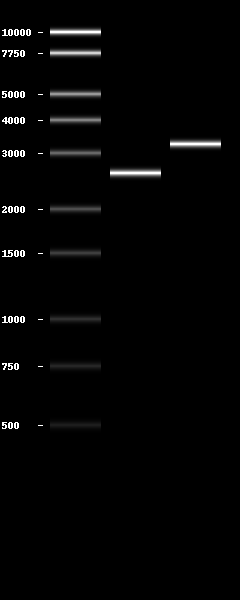

In [16]:
#simulate the gel electrophoresis
bands = [G8H_amplicon, CPR_amplicon]
for band in bands:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in bands]])

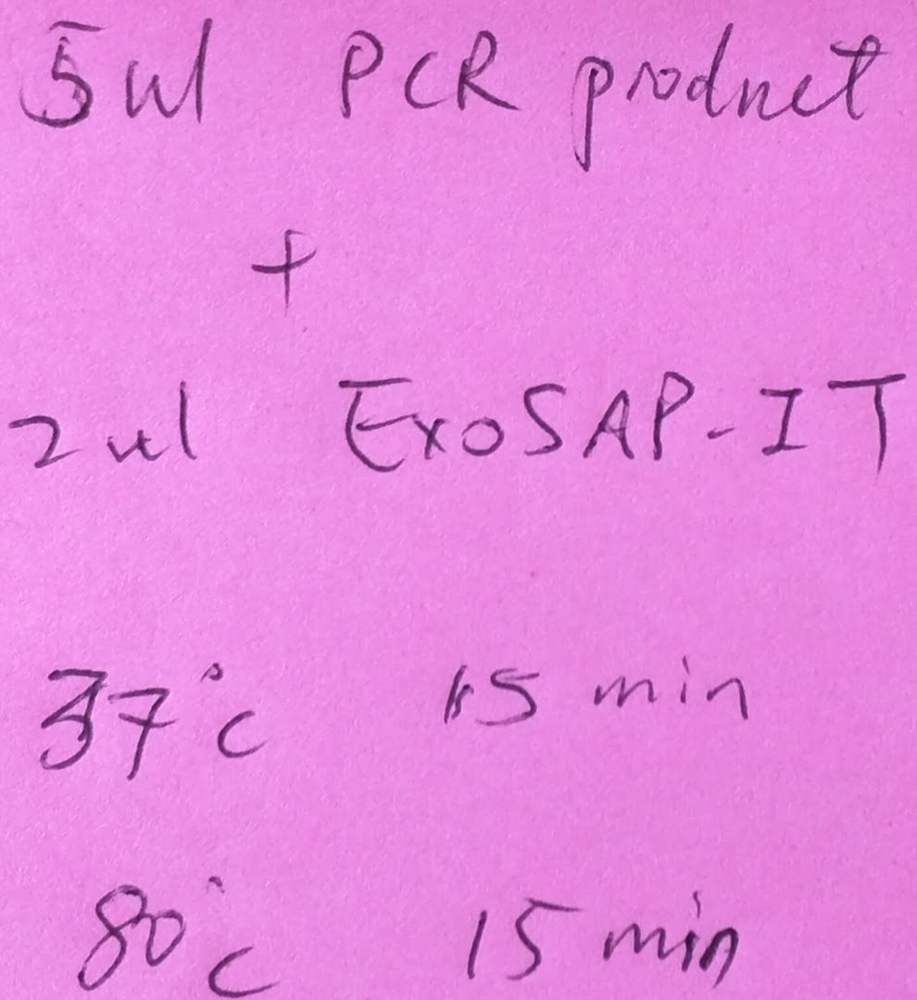

In [17]:

IPython.core.display.Image('../data/methods/sequencing_prep.png', width=300)

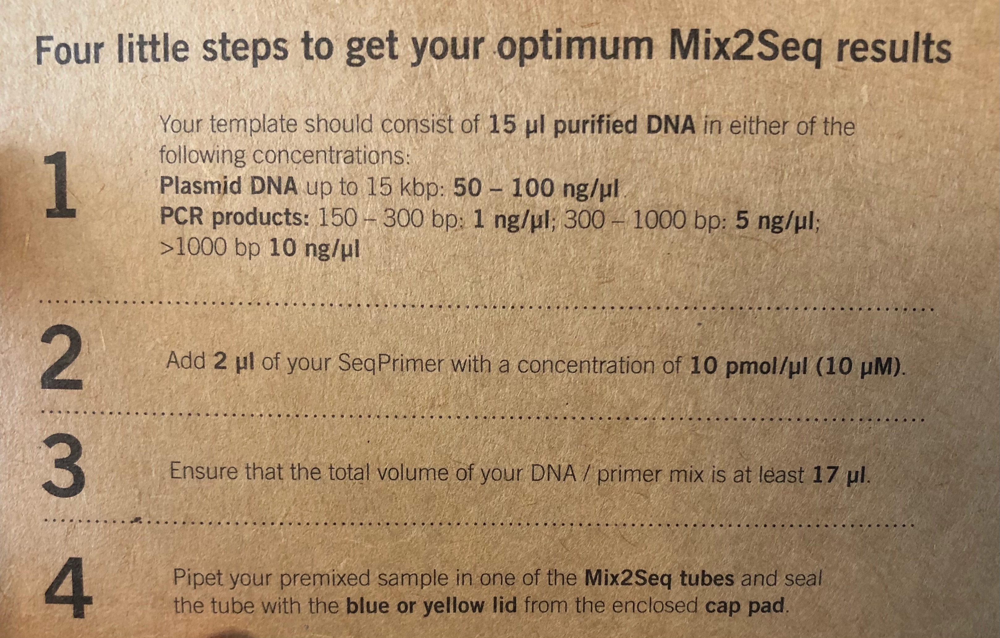

In [18]:

IPython.core.display.Image('../data/methods/sequencing_mix2seq.jpg', width=600)

In [19]:
#Sequencing primers
pad_pG8H_fw  = Dseqrecord('GGCGTATGGACCTGTCT')
pad_pG8H_fw.name = 'pad_pG8H_fw'
pad_pCPR_fw  = Dseqrecord('TGCCCATTCGATAAGGCA')
pad_pCPR_fw.name = 'pad_pCPR_fw'
print(pad_pG8H_fw.seq, pad_pCPR_fw.seq)

GGCGTATGGACCTGTCT TGCCCATTCGATAAGGCA


After the ExoSAP-IT reaction, the 7 ul (5 ul PCR and 2 ul exosap) should be mixed with 8  ul H2O and 2 ul primer. 


In [20]:


# Locations
pad_pG8H_fw.annotations['batches'] = [{'location'    :'primer_box1',
                                 'volume'       : 100,
                                 'concentration': 100}]
pad_pCPR_fw.annotations['batches'] = [{'location'    :'primerbox2',
                                 'volume'       : 100,
                                 'concentration': 100}]



In [21]:
print('19, 20 and 20 should have:\t', pad_pG8H_fw.name, '\tat', pad_pG8H_fw.annotations['batches'][0]['location'])

print('1-17 should have:\t\t',pad_pCPR_fw.name, '\tat', pad_pCPR_fw.annotations['batches'][0]['location'])

19, 20 and 20 should have:	 pad_pG8H_fw 	at primer_box1
1-17 should have:		 pad_pCPR_fw 	at primerbox2


CPR
1 - 17

G8H
19, 20, 21

In [22]:
IPython.core.display.Image('../data/raw/001_Bioimager/2021-08-18_seq.jpg', width=600)

not expecting sequencing result from 1, maybe 21 

get seq data from https://eurofinsgenomics.eu/en/ecom/my-account/my-orders/

To get better sequencing data, 20 ul of PCR product and 200 ul Ethanol (99%) was mixed at 1600 and added in the -20 freezer. The day after it was spinned down 11.000g in 10 min, supernatant removed, 10 or 20 ul H2O, throroughly dissolve, add primer and send for sequencing. 

The sequencing was repeated as above (both on with ExoSAP and one with ethanol)

Since I dont send in a plate I dont get quality data. therefore I have to manually check the quality 


# Machine Learning outcome
- 240 strains were sampled, and from these 149 strains were accepted.
- Many top produceres were nnot included, therefore the top 20 non sequenced producers were resequenced. See Second sequnecing (this is placed later to allow for simulation)


This resulted in:
- From 480 sequence reads, 399 were accepted
- 175 of the strains had accepted sequence data for G8H and CPR and strictodisine data 
- 9 doublicates -> 166 unique strains



#### Getting parts based on RMSE

In [23]:
#Get prediction data
df = pd.read_csv('../data/processed/ML_First_lib_predicted/Predicted_strict_named_CMP_RMSE.csv')

#Iterate through the list of predictions and save new encountered parts. Stop after 180 combiantions.
#Initialisation
parts_encounteres = {'G8H':[],'pG8H':[], 'pCPR': [], 'CPR': []}
sum_of_parts = 0
i = 0
g8h_count = 0
cpr_count = 0
pg8h_count = 0
pcpr_count = 0

#Loop through the predctions and save new parts. 
while sum_of_parts < 180:
    g8h = df.G8H[i]
    pg8h = df.pG8H[i]
    cpr = df.CPR[i]
    pcpr = df.pCPR[i]
    old_sum = copy.copy(sum_of_parts)
    if g8h not in parts_encounteres['G8H']:
        parts_encounteres['G8H'].append(g8h)
        g8h_count += 1
    if pg8h not in parts_encounteres['pG8H']:
        parts_encounteres['pG8H'].append(pg8h)
        pg8h_count += 1
    if cpr not in parts_encounteres['CPR']:
        parts_encounteres['CPR'].append(cpr)
        cpr_count += 1
    if pcpr not in parts_encounteres['pCPR']:
        parts_encounteres['pCPR'].append(pcpr)
        pcpr_count += 1
    sum_of_parts =  g8h_count*cpr_count*pg8h_count*pcpr_count
    if sum_of_parts > old_sum:
        print("Prediction", i+1)
        print('G8H: ',parts_encounteres['G8H'])
        print('pG8H:',parts_encounteres['pG8H'])
        print('pCPR:',parts_encounteres['pCPR'])
        print('CPR: ',parts_encounteres['CPR'])
        print("Number of combinations", sum_of_parts)
        print(g8h_count, pg8h_count, pcpr_count,cpr_count)
        print('\n')
    i += 1
                          
    

Prediction 1
G8H:  ['Rsep']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo']
Number of combinations 1
1 1 1 1


Prediction 2
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo']
Number of combinations 2
2 1 1 1


Prediction 3
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo', 'Ara']
Number of combinations 4
2 1 1 2


Prediction 4
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo', 'Ara', 'Rse']
Number of combinations 6
2 1 1 3


Prediction 5
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo', 'Ara', 'Rse', 'Aan']
Number of combinations 8
2 1 1 4


Prediction 7
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Clo', 'Ara', 'Rse', 'Aan', 'Cro']
Number of combinations 10
2 1 1 5


Prediction 8
G8H:  ['Rsep', 'Smus']
pG8H: ['ENO2', 'CYC1']
pCPR: ['TPI1']
CPR:  ['Clo', 'Ara', 'Rse', 'Aan', 'Cro', 'Ani']
Number of combinations 24
2 2 1 6


Prediction 9
G8H:  ['Rsep', 'Smus', 'Oeu']
pG8H: ['ENO2', 'CYC1']
pCPR: ['TPI1']
CPR:  [

#### Getting parts based on MAE

In [24]:
#Get prediction data
df = pd.read_csv('../data/processed/ML_First_lib_predicted/Predicted_strict_named_CMP_MAE.csv')

#Iterate through the list of predictions and save new encountered parts. Stop after 180 combiantions.
#Initialisation
parts_encounteres = {'G8H':[],'pG8H':[], 'pCPR': [], 'CPR': []}
sum_of_parts = 0
i = 0
g8h_count = 0
cpr_count = 0
pg8h_count = 0
pcpr_count = 0

#Loop through the predctions and save new parts. 
while sum_of_parts < 180:
    g8h = df.G8H[i]
    pg8h = df.pG8H[i]
    cpr = df.CPR[i]
    pcpr = df.pCPR[i]
    old_sum = copy.copy(sum_of_parts)
    if g8h not in parts_encounteres['G8H']:
        parts_encounteres['G8H'].append(g8h)
        g8h_count += 1
    if pg8h not in parts_encounteres['pG8H']:
        parts_encounteres['pG8H'].append(pg8h)
        pg8h_count += 1
    if cpr not in parts_encounteres['CPR']:
        parts_encounteres['CPR'].append(cpr)
        cpr_count += 1
    if pcpr not in parts_encounteres['pCPR']:
        parts_encounteres['pCPR'].append(pcpr)
        pcpr_count += 1
    sum_of_parts =  g8h_count*cpr_count*pg8h_count*pcpr_count
    if sum_of_parts > old_sum:
        print("Prediction", i+1)
        print('G8H: ',parts_encounteres['G8H'])
        print('pG8H:',parts_encounteres['pG8H'])
        print('pCPR:',parts_encounteres['pCPR'])
        print('CPR: ',parts_encounteres['CPR'])
        print("Number of combinations", sum_of_parts)
        print(g8h_count, pg8h_count, pcpr_count,cpr_count)
        print('\n')
    i += 1
                          
    

Prediction 1
G8H:  ['Cro']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Ara']
Number of combinations 1
1 1 1 1


Prediction 2
G8H:  ['Cro']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Ara', 'Clo']
Number of combinations 2
1 1 1 2


Prediction 3
G8H:  ['Cro', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1']
CPR:  ['Ara', 'Clo', 'Aan']
Number of combinations 6
2 1 1 3


Prediction 4
G8H:  ['Cro', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1', 'CCW12']
CPR:  ['Ara', 'Clo', 'Aan']
Number of combinations 12
2 1 2 3


Prediction 5
G8H:  ['Cro', 'Smus']
pG8H: ['ENO2']
pCPR: ['TPI1', 'CCW12']
CPR:  ['Ara', 'Clo', 'Aan', 'Rse']
Number of combinations 16
2 1 2 4


Prediction 6
G8H:  ['Cro', 'Smus', 'Rsep']
pG8H: ['ENO2']
pCPR: ['TPI1', 'CCW12']
CPR:  ['Ara', 'Clo', 'Aan', 'Rse']
Number of combinations 24
3 1 2 4


Prediction 7
G8H:  ['Cro', 'Smus', 'Rsep']
pG8H: ['ENO2']
pCPR: ['TPI1', 'CCW12']
CPR:  ['Ara', 'Clo', 'Aan', 'Rse', 'Cro']
Number of combinations 30
3 1 2 5


Prediction 21
G8H:  ['Cro', 'Smus', 'Rsep', 'Opum']
pG8H:

From this outcome, the parts encountered in the first 20 predictions were taken, resulting in 140 combinations and 35 transformations. 

# ML disc
Skriv noget ned om hvad vi ser på ML fordelingen: 
helt objektivt ser vi at de mest representerede gener er. 
biologisk set er promoterne frøst den høj-lav, og dernæst den konstitutiv høje. 


For at vælge hvilke gener vi skal gå videre med siger vi at vi skal fra toppen sige så har vi 4 parts, hver gang vi gpr ned ad listen så tilføjer vi en part hvis en ny er repræsenteret.Når vi har det antal parts der tilsammen giver 180 (fx 4*3*3*5) stopper vi. disse skal bruges. Men der skal muligvis tages nogle fra hvis det bliver fo rmange plader. lav derefter firguren som viser distributionen af parts i hver del. Her skal der diskuteres. det er interessant at vi ser 

Vi går efter samlping teorien hvor vi siger hvis der er 180 mulige, så vil vi også sample 180. dvs. hvis vi har 20 plader tager vi 9 fra hver, da der skulle være 9 mulige kombinationer på en plade. 


Vi vil udfylde design rummet ved disse recomendations 


Min runde er optimal sampling -> i og med at vi vil sample det antal mulige combinationer der er. 
første rundte var ikke optimal fordi vi ikke samplede 1200 oga kapacitet. Det vil vi denne gang da vi har det. 
hvis vi havde flere fundter ville vi være mere explorative - i og med at vi så havde mere tid til at ud fylde design rummet - for vi vil stadig gerne sample antallet af mulige. men i dette tilfælde vil vi forsge at gøre det så "hurtgit/smart" som muligt ved de to runder vi har. Derfor forsøger vi iat finde en af de bedste i den anden rundte, ud fra de recommendations vi har fået i første rundte. 

målet er at lave en af de bedste på kortest tid. ikke den bedste, for så kunne vi lige så godt tage bare at lave alle. vi vil i stedet gerne bruge vores tid på at finde den bedste flere steder i pathwayen, og derfor prioriterer vi at lave 2 iterationer. løsningsrummet er så stort at vi heller ikke kan lave ealle. 


Hvis jeg har lyst kan jeg lave machine learning efter anden iteration og kigge på ændringen i mae. 

tilføj billede af promotere for at forstå dem 

Jeg kan se at promoterne er ret stabiole, der skal vi kun have to af hver ( som er de højt udtrykte). Til gengæld er CPR ikke særlig stabil i og med at der er 7 forskellige indenfor de 25 første predictions. det vil sige at de nok ikke er så vigtige for hvor 'højt det udtrykkes- Til gengæld slaæ vo æamgt på fpr at f¨elstra G8H, og her er de nok lidt vigtigere. 

# Experiment prep

To facilitate CRISPR/Cas9 transformation we need the following: 
- Plasmids to be purified:
    - gRNA plasmid
- Strains to use:
    - MIA-HA1 strains

#### Background strain for insertion

In [25]:
HA1 = SeqIO.read("../data/HA1.gb", "gb")
HA1.annotations['topology'] = "linear"

A new stock is made from the base Y1A1 (MIA-HA-1b) -> YPD media with 200 ul cell stock. (the same strains used in 05-SDP-AllLibraries)
The cells were plated on YPD before preparing precultures. 

For the third transformation I made a new stock of MIA-HA-1b 14/09

### Plasmid with gRNA: 
- pESC-URA-gRNA_XI2-2


- From LabCollecter the location of the E.coli strain with the plasmid can be found. (Here I found it in the document Jie_DNA_Inventory@CFB)
    - LAB collection ID: 9652, box: BD, pos: B7
    
    
- A new stock must be made. 
    - Grow in LB+amp (4x5ml) (here in yeast trp + amp)
    - make miniprep
    
    - Perforned twice. 

In [26]:
#Extract gRNA information and save the cut sequence
pgRNA = SeqIO.read('../data/Plasmids/pl_12_i6_pesc-ura-grna_xi2-2.gb', 'gb')
pgRNA.name = "pESC-URA-gRNA_XI2-2"

pgRNA.annotations['batches'] = [{'location'    :'p1_A7',
                                 'volume'       : 145,
                                 'concentration': 160}]
XI2_2_gRNA = pydna.dseqrecord.Dseqrecord("ACCCCCCTCAACTGATCAAC", name = "XI2-2_gRNA")
pgRNA.annotations['batches']

[{'location': 'p1_A7', 'volume': 145, 'concentration': 160}]

### Control plasmids

In [27]:
#import plasmids needed for controls
TRP_plasmid = SeqIO.read('../data/Plasmids/TRP_POS_CONTROL_test.gb', 'gb')
TRP_plasmid.annotations['batches']=[{'location':'pL_01_C2', 'volume':30, 'concentration':190 }]
URA_plasmid = SeqIO.read('../data/Plasmids/URA_POS_CONTROL_test.gb', 'gb')
URA_plasmid.annotations['batches']=[{'location':'pL_01_C4', 'volume':10, 'concentration':200 }] # Lav egen batch Actual {'location':'pL_01_C4', 'volume':40, 'concentration':600 }

/Users/lucaslevassor/opt/anaconda3/envs/constrain/lib/python3.8/site-packages/Bio/GenBank/__init__.py:359: BiopythonParserWarning: Attempting to fix invalid location '3339..3288' as it looks like incorrect origin wrapping. Please fix input file, this could have unintended behavior.
  warnings.warn(


### Tempaltes for part creation

In [28]:
#Template names to extract parts
G8H_template_names = ["pESC-CEN_RS-OeuG8H","PL_10_A1pMIA_JZ-40_CroG8H","pMIA_086_Rsep_G8O_in_p0057_(TRP)","pMIA_087_Vmin_G8O_in_p0057_(TRP)","pMIA_090_Smus_G8O_in_p0057_(TRP)"]
pG8H_template_names = ['pCYC1','pENO2']

CPR_template_names = ["pMIA_042_Cro_CPR_in_pRS415_USER_(leu)_-_TEF1","pMIA_048_(G2_Aan_CPR_(TEF1)_in_pRS415U_(LEU))","pMIA_055_ATR1_in_pRS415_USER_(leu)_-_TEF1","PL_13_E6_(pRS415U-P2_TEF1-CloCPR_opt2)","PL_13_E7_(pRS415U-P2_TEF1-RseCPR_opt2)","PL_13_E8_(pRS415U-P2_TEF1-AhuCPR_opt2)","PL_13_E9_(pRS415U-P2_TEF1-AniCPR_opt2)"]
pCPR_template_names = ['pCCW12','pTPI1',]

marker_template_names = ["pL_01_E8_(pRS414-USER-ccdB)"]

## Importing sequences

In [89]:
from Bio import SeqIO
CPR_sites = []
G8H_sites = []
pCPR_sites= []
pG8H_sites= []

# GEtting the objects from the gb files
for seq_record in SeqIO.parse('../data/G8H_CPR_parts/CPR_tCYC1_-_2022-06-06.gb', format= 'gb'):
    CPR_sites.append(seq_record)
    
# GEtting the objects from the fasta files
for seq_record in SeqIO.parse('../data/G8H_CPR_parts/G8H_tADH1_-_2022-06-23.gb', format= 'gb'):
    G8H_sites.append(seq_record)   

    
# GEtting the objects from the gb files
for seq_record in SeqIO.parse('../data/promoter_gb_files/pCPR_sites.gb', format= 'gb'):
    pCPR_sites.append(seq_record)
    
# GEtting the objects from the fasta files
for seq_record in SeqIO.parse('../data/promoter_gb_files/pG8H_sites.gb', format= 'gb'):
    pG8H_sites.append(seq_record)   
    
    
UP_DW_MARKER = []
for seq_record in SeqIO.parse('../data/G8H_CPR_parts/UP_DW_Marker.fasta', format= 'fasta'):
    UP_DW_MARKER.append(seq_record)

UP_sites, DW_sites, marker_sites = [UP_DW_MARKER[0]], [UP_DW_MARKER[1]], [UP_DW_MARKER[2]]


In [90]:
pCPR_sites_PROM1 = pCPR_sites[2]
pCPR_sites_PROM2 = pCPR_sites[0]
pCPR_sites1 = [pCPR_sites_PROM1 , pCPR_sites_PROM2]

pCPR_sites1

[SeqRecord(seq=Seq('AAGGATGAGCCAAGAATAAGGGAACAAGATTTTGGTAATTTCCAAAAAATCAAT...AAA'), id='seq_Au475lsO', name='pTPI1', description='', dbxrefs=[]),
 SeqRecord(seq=Seq('AAAGAAACTTAATACGTTATGCCGTAATGAAGGGCTACCAAAAACGATAATCTC...ATA'), id='seq_KLllyItE', name='pCCW12', description='', dbxrefs=[])]

In [91]:
#Adding batches manually
p_temp_loc = 'l4_A01'
    
for temp in pG8H_sites:
    temp.annotations["batches"] = [{'location':p_temp_loc, 'volume':20,'concentration:': 120}]
    
for temp in pCPR_sites:
    temp.annotations["batches"] = [{'location':p_temp_loc, 'volume':20,'concentration:': 120}]
    
for temp in UP_DW_MARKER:
    temp.annotations["batches"] = [{'location':'pL_01_E8', 'volume':100,'concentration:': 40}]
    
UP_sites[0].name = 'XI-2_UP'
DW_sites[0].name = 'XI-2_DW'

In [92]:
#Provide annotations and names for parts. 
G8H_CDS_annotations = ["OeuG8O", "CroG8O", "Rsep_G8O_opt", "Vmin_G8O_opt", "Smus_G8O_opt"]
G8H_site_names = ["OeuG8H_tADH1", "CroG8H_tADH1", "RsepG8H_tADH1", "VminG8H_tADH1", "SmusG8H_tADH1"]

pG8H_annotations = ['pCYC1','pENO2']
pG8H_names = ['pCYC1','pENO2']

pCPR_annotations = ['pCCW12','pTPI1']
pCPR_names = ['pCCW12','pTPI1']

CPR_CDS_annotations = ['Cro CPR', 'Aan CPR', 'ATR1 Arabidopsis CPR','CloCPR_opt2','RseCPR_opt2','AhuCPR_opt2','AniCPR_opt2']
CPR_site_names = ['CroCPR_tCYC1', 'AanCPR_tCYC1', 'AraCPR_tCYC1','CloCPR_tCYC1','RseCPR_tCYC1','AhuCPR_tCYC1','AniCPR_tCYC1']

marker_cassette_annotations = ["TRP1_marker"]
marker_cassette_names = ["cTRP1"]

In [93]:
CPR_sites[-2].name = 'AraCPR_tCYC1'

In [94]:
# Lets import some ConStrain function to help with the construction of the combinatorial library
from constrain.design.cloning import extract_template_amplification_sites, extract_sites, multiplyList, removeTupleDuplicates, seq_to_annotation,plate_plot , casembler


In [95]:
pCPR_sites

[SeqRecord(seq=Seq('AAAGAAACTTAATACGTTATGCCGTAATGAAGGGCTACCAAAAACGATAATCTC...ATA'), id='seq_KLllyItE', name='pCCW12', description='', dbxrefs=[]),
 SeqRecord(seq=Seq('TTTAATCTTTAGGGAGGGTAAAGTTGGATTCATCAATTTGATGAAATCCGTGTA...AAA'), id='seq_oMyQ3Qgm', name='pMLS1', description='', dbxrefs=[]),
 SeqRecord(seq=Seq('AAGGATGAGCCAAGAATAAGGGAACAAGATTTTGGTAATTTCCAAAAAATCAAT...AAA'), id='seq_Au475lsO', name='pTPI1', description='', dbxrefs=[]),
 SeqRecord(seq=Seq('CAAGCTGAACTCGCTGAAATTGAAAGAAAACTGGCAGAATCGTCTTCTGAAGAC...CAA'), id='seq_y4NqOW17', name='pURE2', description='', dbxrefs=[])]

In [96]:
from Bio.Seq import Seq
# promoters
pG8H_sites = extract_sites(pG8H_annotations, pG8H_sites, pG8H_names)

pCPR_sites = extract_sites(pCPR_annotations, pCPR_sites1, pCPR_names)

## Fixing this 
#pCPR_sites[1].name = 'pTPI1'
#pCPR_sites[1].seq = Seq(pTPI1_seq)
#pCPR_sites

In [97]:
pCPR_sites

[SeqRecord(seq=Seq('AAGGATGAGCCAAGAATAAGGGAACAAGATTTTGGTAATTTCCAAAAAATCAAT...AAA'), id='seq_Au475lsO', name='pTPI1', description='', dbxrefs=[]),
 SeqRecord(seq=Seq('AAAGAAACTTAATACGTTATGCCGTAATGAAGGGCTACCAAAAACGATAATCTC...ATA'), id='seq_KLllyItE', name='pCCW12', description='', dbxrefs=[])]

In [98]:
# Reverse complementing the promoters
pG8H_sites = [site.reverse_complement(annotations=True,name=True) for site in pG8H_sites]
pG8H_sites

[SeqRecord(seq=Seq('TATTAATTTAGTGTGTGTATTTGTGTTTGTGTGTCTATAGAAGTATAGTAATTT...CTG'), id='<unknown id>', name='pCYC1', description='<unknown description>', dbxrefs=[]),
 SeqRecord(seq=Seq('TATTATTGTATGTTATAGTATTAGTTGCTTGGTGTTATGAAAGAAACTAAGAAA...ATT'), id='<unknown id>', name='pENO2', description='<unknown description>', dbxrefs=[])]

In [99]:
# Extracting cpr_sites
CPR_site_1 = []

for enzyme in CPR_sites: 
    if str(enzyme.name) in CPR_site_names: 
        CPR_site_1.append(enzyme)

len(CPR_site_1)

7

In [100]:
# Extracting G8H_sites
G8H_site_1 = []

for enzyme in G8H_sites: 
    if str(enzyme.name) in G8H_site_names: 
        G8H_site_1.append(enzyme)

len(G8H_site_1)

5

In [101]:
from constrain.design.cloning import multiplyList

In [102]:
#Create a list of fragments within a list of parts.
fragment_list = [UP_sites,G8H_site_1,pG8H_sites,pCPR_sites,CPR_site_1,marker_sites,DW_sites]

#The number of fragments to be assembled
no_frags = len(fragment_list)
print("Number of fragments:", no_frags)

#The number of parts of each fragment
no_parts = [len(l) for l in fragment_list]
print("Number of parts: ",no_parts)

#The number of possible combinations
no_combs = multiplyList(no_parts)
print("Number of possible combinations:",no_combs)

#How many repitions are needed?
repetition_list = [int(no_comb/no_part) for no_comb, no_part in zip([no_combs]*len(no_parts),no_parts)]
print("The number of time each fragment must be repeated:", repetition_list)

#Matrix with all combinations
combinations_matrix = [t for t in itertools.product(*fragment_list)]
for row in combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)

Number of fragments: 7
Number of parts:  [1, 5, 2, 2, 7, 1, 1]
Number of possible combinations: 140
The number of time each fragment must be repeated: [140, 28, 70, 70, 20, 140, 140]
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'AhuCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'AanCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'CloCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'AniCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'RseCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'AraCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pTPI1', 'CroCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pCCW12', 'AhuCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'CroG8H_tADH1', 'pCYC1', 'pCCW12', 'AanCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'C

In [104]:
pCPR_sites[0]

SeqRecord(seq=Seq('AAGGATGAGCCAAGAATAAGGGAACAAGATTTTGGTAATTTCCAAAAAATCAAT...AAA'), id='seq_Au475lsO', name='pTPI1', description='', dbxrefs=[])

Fragments have been amplified in a previous part of this project (but performed by me), and the amount remaining must be checked. 


### Information about parts from previous experiments


In [105]:
#Read files with primer and parts information
lea_primers = pd.read_excel("../data/raw/G8H_CPR_library.xls", sheet_name = "all primers").reset_index(drop=True)
lea_parts = pd.read_excel("../data/raw/G8H_CPR_library.xls", sheet_name = "all parts").reset_index(drop=True)

In [106]:
#Initialize matrix
primer_matrix = [[] for i in range(no_combs)]
for comb_no in range(0, no_combs):
    for frag_no in range(0, no_frags):
        comb_seq = str(combinations_matrix[comb_no][frag_no].seq.upper())
        
        #for G8H and CPR genes position are changed to promoters. 
        if frag_no == 1:
            idx = frag_no + 1
        elif frag_no == 4:
            idx = frag_no - 1
        else:
            idx  = frag_no
        
        
        #Find the row that matches the part
        #If the frag is G8H or CPR, save pName and find the part that overlaps to this promoter.
        if idx != frag_no:
            name = combinations_matrix[comb_no][idx].name
            true_false = np.logical_and(lea_parts['Sequence'].str.contains(comb_seq), lea_parts['Overlaps_to'] == name)
        #Find the row that mathces the sequence 
        else:
            true_false = lea_parts['Sequence'].str.contains(comb_seq)
        comb_seq_idx = lea_parts[true_false].index

        
        #Save forward primer information
        forward_primer_name = lea_parts.loc[comb_seq_idx,['Forward Oligo Name']].values[0][0]
        forward_primer_idx = lea_primers[lea_primers['Name'] == forward_primer_name].index
        forward_seq = lea_primers.loc[forward_primer_idx,['Sequence']].values[0][0]
        if forward_primer_name == 'PR_G8H_01':
            forward_loc = 'o3_F07'
        else:
            forward_loc = lea_primers.loc[forward_primer_idx,['Location']].values[0][0]
        forward_primer = pydna.primer.Primer(pydna.dseqrecord.Dseqrecord(forward_seq, id = forward_primer_name))
        forward_primer.annotations['batches'] = []
        forward_primer.annotations['batches'].append({'location': forward_loc, 'volume': 100, 'concentration': 10})
        
        #Save reverse primer information
        reverse_primer_name = lea_parts.loc[comb_seq_idx,['Reverse Oligo Name']].values[0][0]
        reverse_primer_idx  = lea_primers[lea_primers['Name'] == reverse_primer_name].index
        reverse_seq = lea_primers.loc[reverse_primer_idx,['Sequence']].values[0][0]
        if reverse_primer_name == 'PR_G8H_01':
            forward_loc = 'o3_F07'
        else:
            reverse_loc = lea_primers.loc[reverse_primer_idx,['Location']].values[0][0]
        reverse_primer = pydna.primer.Primer(pydna.dseqrecord.Dseqrecord(reverse_seq, id = reverse_primer_name))
        reverse_primer.annotations['batches'] = []
        reverse_primer.annotations['batches'].append({'location': reverse_loc, 'volume': 100,  'concentration': 10})
        
        #Save to primer matrix 
        primer_matrix[comb_no].append((forward_primer, reverse_primer))

In [107]:
from constrain.design.cloning import seq_to_annotation, recs_no_duplicates

In [108]:
#Initizalise
amplicon_matrix = [[] for i in range(no_combs)]

#Create a matrix with relevant parts
for comb_no in range(0, no_combs):
    for frag_no in range(0, no_frags):
        #Extract sequences
        template       = pydna.dseqrecord.Dseqrecord(combinations_matrix[comb_no][frag_no])
        forward_primer = primer_matrix[comb_no][frag_no][0]
        reverse_primer = primer_matrix[comb_no][frag_no][1]
        
        #amplify the part and annotate
        amplicon = pydna.amplify.pcr(forward_primer, reverse_primer,  template)
        amplicon.annotations['template_name'] = template.name

        #Check the sequence in the sheet and get position
        comb_seq     = amplicon.seq.watson.upper()
        true_false   = lea_parts['Sequence'].str.contains(comb_seq)
        comb_seq_idx = lea_parts[true_false].index
        
        #Extract relevant information
        amplicon_name = lea_parts.loc[comb_seq_idx,['Name']].values[0][0]
        amplicon.name = amplicon_name
        amplicon_loc  = lea_parts.loc[comb_seq_idx,['Location']].values[0][0]
        amplicon_vol  = lea_parts.loc[comb_seq_idx,['volume']].values[0][0]
        amplicon_con  = lea_parts.loc[comb_seq_idx,['concentration']].values[0][0]
        amplicon.annotations['batches'] = []
        amplicon.annotations['batches'].append(  {'location'      : amplicon_loc,
                                                  'volume'        : amplicon_vol,
                                                  'concentration' : amplicon_con})
        amplicon.forward_primer.annotations['tm Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_fw_tm']].values[0][0]
        amplicon.reverse_primer.annotations['tm Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_rv_tm']].values[0][0]
        amplicon.annotations['ta Q5 Hot Start'] = lea_parts.loc[comb_seq_idx,['Q5_ta']].values[0][0]
        primary_temp_name = lea_parts.loc[comb_seq_idx, ['Primary Template Name']].values[0][0]
        promoter = lea_parts.loc[comb_seq_idx, ['Promoter']].values[0][0]
        part = lea_parts.loc[comb_seq_idx, ['Part']].values[0][0]
        if pd.isna(promoter) and pd.isna(part):
            amplicon.part_name = primary_temp_name
        elif pd.isna(promoter):
            amplicon.part_name = part
        elif pd.isna(part):
            amplicon.part_name = promoter

        ## Remove additional wrong primer annotation added by pydna.amplify.pcr
        amplicon.features = [feat for feat in amplicon.features if feat.type != "primer_bind"]
        
        #Add sequence of PCR product and primers to relevant parts
        seq_to_annotation(amplicon, amplicon, "PCR_product")
        seq_to_annotation(forward_primer, amplicon, "primer_bind")
        seq_to_annotation(reverse_primer, amplicon, "primer_bind")
        
        #Append to matrix
        amplicon_matrix[comb_no].append(amplicon)




In [109]:
#Create a matrix with lists of fragments and remove dublicates
amplicon_matrix_reshaped = [list(x) for x in zip(*amplicon_matrix)]
amplicon_matrix_reshaped_no_duplicates = [recs_no_duplicates(lst) for lst in amplicon_matrix_reshaped]

In [110]:
print("Fragments needed for the experiment:")
print("Name", '\t\t', "Part name", '\t', "location")
for frag_list_no, frag_list in enumerate(amplicon_matrix_reshaped_no_duplicates):
    print("All parts for fragment no: " + str(frag_list_no+1))
    for frag in frag_list:
        print(frag.name, '\t', frag.part_name, '\t', frag.annotations['batches'][0]['location'])
    print()


Fragments needed for the experiment:
Name 		 Part name 	 location
All parts for fragment no: 1
PCR_UP_tADH1_01 	 XI-2_UP 	 l5_I08

All parts for fragment no: 2
PCR_G8H_21 	 CroG8H_tADH1 	 l5_C05
PCR_G8H_22 	 CroG8H_tADH1 	 l5_C06
PCR_G8H_09 	 RsepG8H_tADH1 	 l5_B02
PCR_G8H_10 	 RsepG8H_tADH1 	 l5_B03
PCR_G8H_05 	 SmusG8H_tADH1 	 l5_A07
PCR_G8H_06 	 SmusG8H_tADH1 	 l5_A08
PCR_G8H_01 	 VminG8H_tADH1 	 l5_A03
PCR_G8H_02 	 VminG8H_tADH1 	 l5_A04
PCR_G8H_29 	 OeuG8H_tADH1 	 l5_D04
PCR_G8H_30 	 OeuG8H_tADH1 	 l5_D05

All parts for fragment no: 3
PCR_PRO_01 	 pCYC1 	 l4_C07
PCR_PRO_06 	 pENO2 	 l4_D03

All parts for fragment no: 4
PCR_PRO_04 	 pTPI1 	 l4_D01
PCR_PRO_02 	 pCCW12 	 l4_C08

All parts for fragment no: 5
PCR_CPR_16 	 AhuCPR_tCYC1 	 l5_G06
PCR_CPR_20 	 AanCPR_tCYC1 	 l5_E08
PCR_CPR_19 	 CloCPR_tCYC1 	 l5_F07
PCR_CPR_17 	 AniCPR_tCYC1 	 l5_H01
PCR_CPR_12 	 RseCPR_tCYC1 	 l5_G02
PCR_CPR_13 	 AthATR1_tCYC1 	 l5_F03
PCR_CPR_11 	 CroCPR_tCYC1 	 l5_E04
PCR_CPR_36 	 AhuCPR_tCYC1 	 l5_G08


The genes should be represented in dublicates, as they each have an overlap to a promoter. To easen the transformation, the two gene parts are pooled together. The same goes for the promoters, and UP, DW and cTRP1. 

In [111]:
amplicons = [item for sublist in amplicon_matrix_reshaped_no_duplicates for item in sublist]
print("Number of parts to be used:", len(amplicons))

Number of parts to be used: 31


# Create new parts
Since there are some leftovers of parts, their volume were check. 
There were parts I made previously (single) and there were parts of genes that had been pooled (Sørens) 
I used as many of the single parts, because Sørens also containrf overhangs from two other promoters that were not used here. To save time, those were the single ones are missing, Sørens was used. 

Refer to section [Test amounts needed vs what is available](#Test_amounts_needed_vs_what_is_available)

As the second round of transfomration failed, more parts were needed, and the ampliciation of these are refered to as parts for the third transfomration. 

#### Parts missing: 
- L4_C8
- L4_D1
- PCR_CPR_33
- PCR_CPR_13

XI-2_UP
XI-2_DW
TRP
gRNA
CroCPR
AraCPR
AhuCPR

In [112]:
#Define a function that extracs the amplicons
def amplicon_by_name(name, amplicons_lst):
    for amplicon in amplicons_lst:
        if amplicon.name == name:
            return amplicon

In [113]:
for i in range(len(amplicons)): 
    print(amplicons[i].name)

PCR_UP_tADH1_01
PCR_G8H_21
PCR_G8H_22
PCR_G8H_09
PCR_G8H_10
PCR_G8H_05
PCR_G8H_06
PCR_G8H_01
PCR_G8H_02
PCR_G8H_29
PCR_G8H_30
PCR_PRO_01
PCR_PRO_06
PCR_PRO_04
PCR_PRO_02
PCR_CPR_16
PCR_CPR_20
PCR_CPR_19
PCR_CPR_17
PCR_CPR_12
PCR_CPR_13
PCR_CPR_11
PCR_CPR_36
PCR_CPR_40
PCR_CPR_39
PCR_CPR_37
PCR_CPR_32
PCR_CPR_33
PCR_CPR_31
PCR_TRP1-DW_01
PCR_TRP1-DW_02


o3_F07: PR_G8H_01
GAGCGACCTCATGCTATAC




o3_F08: PR_CPR_02
TTCTCAAGCAAGGTTTTCAG

#### Changed 04 to 03

In [114]:
parts_missing = [amplicon_by_name('PCR_CPR_33', amplicons), amplicon_by_name('PCR_CPR_13', amplicons), amplicon_by_name('PCR_PRO_02', amplicons), amplicon_by_name('PCR_PRO_04', amplicons)]
for part in parts_missing:
    print(part.name, part.annotations)

PCR_CPR_33 {'molecule_type': 'DNA', 'template_name': 'AraCPR_tCYC1', 'batches': [{'location': 'l5_F05', 'volume': 100.0, 'concentration': 20.0}], 'ta Q5 Hot Start': 61}
PCR_CPR_13 {'molecule_type': 'DNA', 'template_name': 'AraCPR_tCYC1', 'batches': [{'location': 'l5_F03', 'volume': 100.0, 'concentration': 10.0}], 'ta Q5 Hot Start': 61}
PCR_PRO_02 {'molecule_type': 'DNA', 'template_name': 'pCCW12', 'batches': [{'location': 'l4_C08', 'volume': 100.0, 'concentration': 100.0}], 'ta Q5 Hot Start': 61}
PCR_PRO_04 {'molecule_type': 'DNA', 'template_name': 'pTPI1', 'batches': [{'location': 'l4_D01', 'volume': 100.0, 'concentration': 90.0}], 'ta Q5 Hot Start': 58}


PCR from previous:
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 58
    - All primers are designed to have 3' Tm 59C-54C, and Ta 59C-62C when using  Q5 2x MasterMix (calculated with NEB Tm calculator)

In [115]:
from constrain.lab.PCR import det_proc_speed, det_elon_time, simple_PCR_program

In [116]:
pol = 'Q5 Hot Start'
for amplicon in amplicons:
    amplicon.annotations['polymerase'] = pol
    amplicon = det_proc_speed(amplicon)
    amplicon = det_elon_time(amplicon)
    amplicon.template.annotations['batches'] = [{'location'    :'o5',
                                 'volume'       : 100,
                                 'concentration': 100}]

In [117]:
#Find the length of the longest amplicon to determine the PCR time
longest_amplicon = 0
for amp in parts_missing:
    if len(amp) > longest_amplicon: longest_amplicon = len(amp)
print("Length of longest amplicon: \t" + str(longest_amplicon) + " bp")
print("Elongation time: \t\t"  + str(round(longest_amplicon/1000 * 35,1))+ " seconds")

Length of longest amplicon: 	2298 bp
Elongation time: 		80.4 seconds


In [118]:
plate_locations = []
for amplicon in parts_missing:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_e_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','template_location','fw_name','fw_location','rv_name','rv_location'])
amplicon_e_df = amplicon_e_df.set_index('name')
amplicon_e_df

,location,template_name,template_location,fw_name,fw_location,rv_name,rv_location
name,,,,,,,
PCR_CPR_33,l5_F05,AraCPR_tCYC1,o5,PR_CPR_32,op4_H03,PR_CPR_02,op4_B10
PCR_CPR_13,l5_F03,AraCPR_tCYC1,o5,PR_CPR_14,op4_F03,PR_CPR_02,op4_B10
PCR_PRO_02,l4_C08,pCCW12,o5,PR_PRO_03,op4_B11,PR_PRO_04,op4_B12
PCR_PRO_04,l4_D01,pTPI1,o5,PR_PRO_07,op4_D11,PR_PRO_08,op4_D12


In [119]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 9,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_9_reac
Template,1.0,9.0
Primer 1,2.5,22.5
Primer 2,2.5,22.5
H20,19.0,171.0
Pol,25.0,225.0
Total,50.0,450.0


In [120]:
for part in parts_missing:
    print("PCR program for", part.name)
    l = simple_PCR_program(part)
    print(l)

PCR program for PCR_CPR_33
|98°C|98°C               |    |tmf:73.0
|____|_____          72°C|72°C|tmr:60.0
|30 s|10s  \ 61.0°C _____|____|30s/kb
|    |      \______/ 1: 9|2min|GC 0%
|    |       20s         |    |2298bp

PCR program for PCR_CPR_13
|98°C|98°C               |    |tmf:71.0
|____|_____          72°C|72°C|tmr:60.0
|30 s|10s  \ 61.0°C _____|____|30s/kb
|    |      \______/ 1: 9|2min|GC 0%
|    |       20s         |    |2298bp

PCR program for PCR_PRO_02
|98°C|98°C               |    |tmf:80.0
|____|_____          72°C|72°C|tmr:63.0
|30 s|10s  \ 64.0°C _____|____|30s/kb
|    |      \______/ 0:31|2min|GC 0%
|    |       20s         |    |1023bp

PCR program for PCR_PRO_04
|98°C|98°C               |    |tmf:81.0
|____|_____          72°C|72°C|tmr:61.0
|30 s|10s  \ 62.0°C _____|____|30s/kb
|    |      \______/ 0:32|2min|GC 0%
|    |       20s         |    |1043bp



PCR_CPR_33
PCR_CPR_13
PCR_PRO_02
PCR_PRO_04


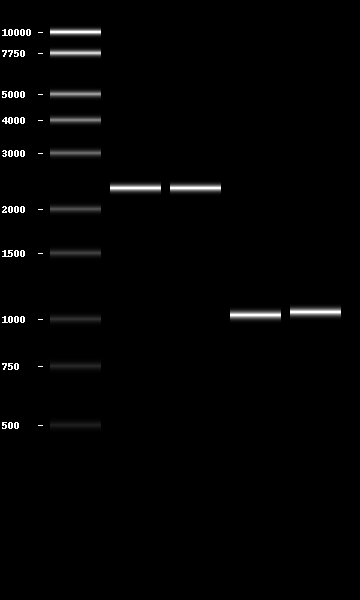

In [121]:
for band in parts_missing:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in parts_missing]])

Mini prep 
conc - values

Ara failed. Promoteres were good. 

In [122]:
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['location'] = 'l5_D01'
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['concentration'] = 55
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches']

[{'location': 'l5_D01', 'volume': 30, 'concentration': 55}]

PCR_PRO_04 was pooled with an older sample. giving a concentration of 72

In [123]:
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['location'] = 'l5_D02'
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['concentration'] = 72
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['volume'] = 50
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches']

[{'location': 'l5_D02', 'volume': 50, 'concentration': 72}]

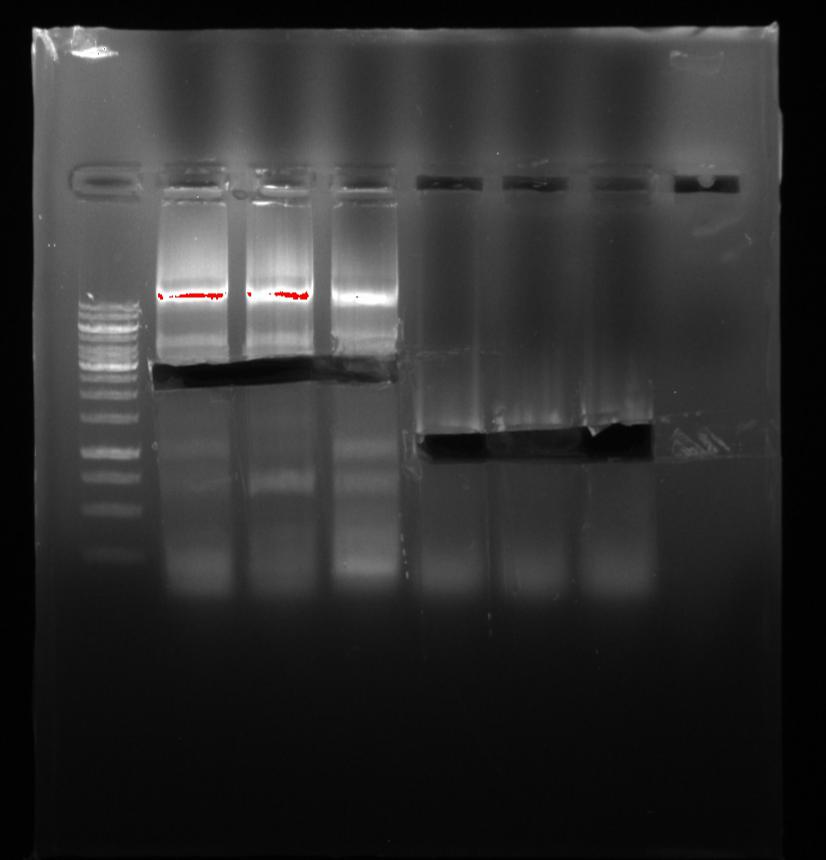

In [124]:

IPython.core.display.Image('../data/raw/001_Bioimager/2021-08-19_Q5part_creation_cut.jpg', width=600)

from the gel we can see a strong band that is big. this is plasmid that is left. I do no t need this much plasmid when making parts. 

## Amplify promoters

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Created with PCR_program created according to protocol
- Elongation time: 31 sek (30 s/ kb)
- Annealing temp 60

In [126]:
parts_missing = [amplicon_by_name('PCR_PRO_01', amplicons),amplicon_by_name('PCR_PRO_02', amplicons), amplicon_by_name('PCR_PRO_04', amplicons), amplicon_by_name('PCR_PRO_06', amplicons)]
for part in parts_missing:
    print(part.name, part.annotations)

PCR_PRO_01 {'molecule_type': 'DNA', 'template_name': 'pCYC1', 'batches': [{'location': 'l4_C07', 'volume': 100.0, 'concentration': 100.0}], 'ta Q5 Hot Start': 60, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 31}
PCR_PRO_02 {'molecule_type': 'DNA', 'template_name': 'pCCW12', 'batches': [{'location': 'l5_D01', 'volume': 30, 'concentration': 55}], 'ta Q5 Hot Start': 64, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 31}
PCR_PRO_04 {'molecule_type': 'DNA', 'template_name': 'pTPI1', 'batches': [{'location': 'l5_D02', 'volume': 50, 'concentration': 72}], 'ta Q5 Hot Start': 62, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 32}
PCR_PRO_06 {'molecule_type': 'DNA', 'template_name': 'pENO2', 'batches': [{'location': 'l4_D03', 'volume': 100.0, 'concentration': 110.0}], 'ta Q5 Hot Start': 61, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 32}


In [127]:
longest_amplicon = 0
for amp in parts_missing:
    if len(amp) > longest_amplicon: longest_amplicon = len(amp)
print("Length of longest amplicon: \t" + str(longest_amplicon) + " bp")
print("Elongation time: \t\t"  + str(round(longest_amplicon/1000 * 35,1))+ " seconds")

Length of longest amplicon: 	1046 bp
Elongation time: 		36.6 seconds


In [128]:
#Information about locations
plate_locations = []
for amplicon in parts_missing:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_e_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','template_location','fw_name','fw_location','rv_name','rv_location'])
amplicon_e_df = amplicon_e_df.set_index('name')
amplicon_e_df

,location,template_name,template_location,fw_name,fw_location,rv_name,rv_location
name,,,,,,,
PCR_PRO_01,l4_C07,pCYC1,o5,PR_PRO_01,op4_A11,PR_PRO_02,op4_A12
PCR_PRO_02,l5_D01,pCCW12,o5,PR_PRO_03,op4_B11,PR_PRO_04,op4_B12
PCR_PRO_04,l5_D02,pTPI1,o5,PR_PRO_07,op4_D11,PR_PRO_08,op4_D12
PCR_PRO_06,l4_D03,pENO2,o5,PR_PRO_11,op4_F11,PR_PRO_12,op4_F12


In [129]:
#PCR program
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 9,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_9_reac
Template,1.0,9.0
Primer 1,2.5,22.5
Primer 2,2.5,22.5
H20,19.0,171.0
Pol,25.0,225.0
Total,50.0,450.0


PCR_PRO_01
PCR_PRO_02
PCR_PRO_04
PCR_PRO_06


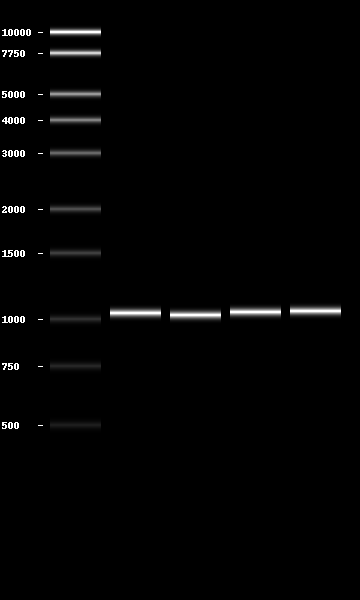

In [130]:
#Gel simulation
for band in parts_missing:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in parts_missing]])

See gel in next section. 

## Amplify parts- CroCPR, AraCPR, AhuCPR
missing:
- CroCPR_tCYC1
- AraCPR_tCYC1
- AhuCPR_tCYC1
- AthATR1_tCYC1


PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Created with PCR_program created according to protocol
- Elongation time: 1:10 min:sek (30 s/ kb)
- Annealing temp 61


UP/DW/TRP: 
PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Created with PCR_program created according to protocol
- Elongation time: 0:45 min:sek (30 s/ kb)
- Annealing temp 61

In [131]:
#Save amplicons that are missing
mis = ['CroCPR_tCYC1','AraCPR_tCYC1','AhuCPR_tCYC1','AthATR1_tCYC1','XI-2_UP','TRP1-marker','XI-2_DW']
missing_ampl = []
for frag_list_no, frag_list in enumerate(amplicon_matrix_reshaped_no_duplicates):
    for frag in frag_list:
        if frag.part_name in mis:
            missing_ampl.append(frag)

In [132]:
#Print information about the parts missing
for part in missing_ampl:
    print(part.name, part.annotations)

PCR_UP_tADH1_01 {'molecule_type': 'DNA', 'template_name': 'XI-2_UP', 'batches': [{'location': 'l5_I08', 'volume': 100.0, 'concentration': 30.0}], 'ta Q5 Hot Start': 60, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 19}
PCR_CPR_16 {'molecule_type': 'DNA', 'template_name': 'AhuCPR_tCYC1', 'batches': [{'location': 'l5_G06', 'volume': 100.0, 'concentration': 25.0}], 'ta Q5 Hot Start': 61, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 71}
PCR_CPR_13 {'molecule_type': 'DNA', 'template_name': 'AraCPR_tCYC1', 'batches': [{'location': 'l5_F03', 'volume': 100.0, 'concentration': 10.0}], 'ta Q5 Hot Start': 61, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 69}
PCR_CPR_11 {'molecule_type': 'DNA', 'template_name': 'CroCPR_tCYC1', 'batches': [{'location': 'l5_E04', 'volume': 100.0, 'concentration': 15.0}], 'ta Q5 Hot Start': 61, 'polymerase': 'Q5 Hot Start', 'proc_speed': 30, 'elongation_time': 71}
PCR_CPR_36 {'molecule_type': 'DNA', 'tem

In [133]:
longest_amplicon = 0
for amp in missing_ampl:
    if len(amp) > longest_amplicon: longest_amplicon = len(amp)
print("Length of longest amplicon: \t" + str(longest_amplicon) + " bp")
print("Elongation time: \t\t"  + str(round(longest_amplicon/1000 * 35,1))+ " seconds")

Length of longest amplicon: 	2364 bp
Elongation time: 		82.7 seconds


In [134]:
plate_locations = []
for amplicon in missing_ampl:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_e_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','template_location','fw_name','fw_location','rv_name','rv_location'])
amplicon_e_df = amplicon_e_df.set_index('name')
amplicon_e_df

,location,template_name,template_location,fw_name,fw_location,rv_name,rv_location
name,,,,,,,
PCR_UP_tADH1_01,l5_I08,XI-2_UP,o5,PR_UP_tADH1_05,o2_I06,PR_UP_tADH1_06,o2_I07
PCR_CPR_16,l5_G06,AhuCPR_tCYC1,o5,PR_CPR_17,op4_F06,PR_CPR_02,op4_B10
PCR_CPR_13,l5_F03,AraCPR_tCYC1,o5,PR_CPR_14,op4_F03,PR_CPR_02,op4_B10
PCR_CPR_11,l5_E04,CroCPR_tCYC1,o5,PR_CPR_12,op4_F01,PR_CPR_02,op4_B10
PCR_CPR_36,l5_G08,AhuCPR_tCYC1,o5,PR_CPR_35,op4_H06,PR_CPR_02,op4_B10
PCR_CPR_33,l5_F05,AraCPR_tCYC1,o5,PR_CPR_32,op4_H03,PR_CPR_02,op4_B10
PCR_CPR_31,l5_E06,CroCPR_tCYC1,o5,PR_CPR_30,op4_H01,PR_CPR_02,op4_B10
PCR_TRP1-DW_01,l5_I07,seq_3HMRtcpy,o5,PR_TRP1-DW_01,op4_C10,PR_TRP1-DW_02,op4_D10
PCR_TRP1-DW_02,l5_I09,XI-2_DW,o5,PR_TRP1-DW_05,o2_I08,PR_TRP1-DW_06,o2_I09


In [135]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 11,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_11_reac
Template,1.0,11.0
Primer 1,2.5,27.5
Primer 2,2.5,27.5
H20,19.0,209.0
Pol,25.0,275.0
Total,50.0,550.0


PCR_UP_tADH1_01
PCR_CPR_16
PCR_CPR_13
PCR_CPR_11
PCR_CPR_36
PCR_CPR_33
PCR_CPR_31
PCR_TRP1-DW_01
PCR_TRP1-DW_02


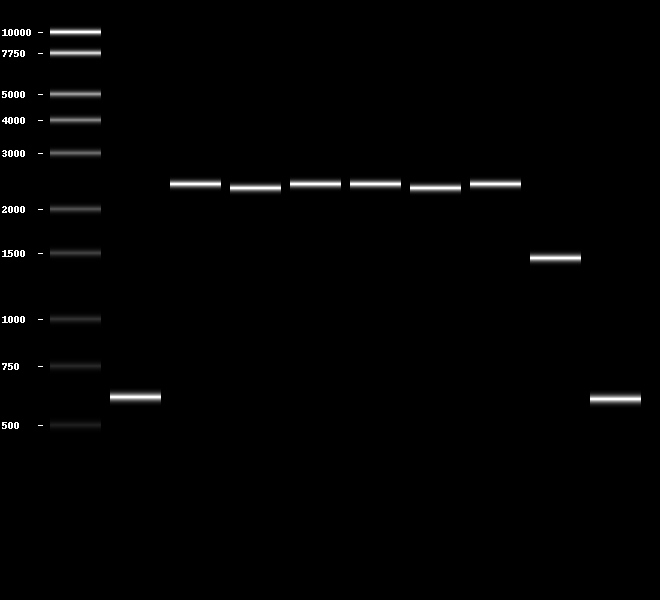

In [136]:
for band in missing_ampl:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in missing_ampl]])

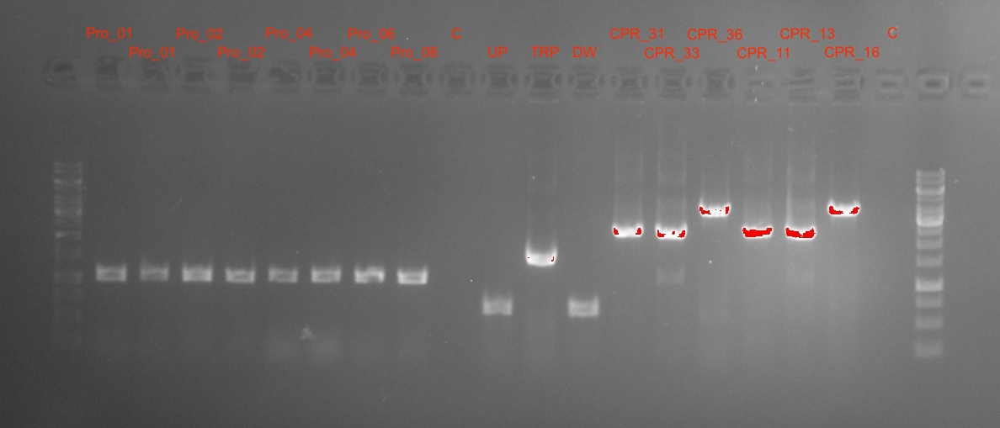

In [137]:
#Gel with promoters and genes. 
IPython.core.display.Image('../data/raw/001_Bioimager/2021-08_30_Q5_parts.jpg', width=600)

The length og CPR_36 and CPR_16 (Ahu) does not match the expected length. 
THey were send for sequencing with the primers used in PCR and the primer from Beata 
BJL 249 AhuCPR seq R, each primer mixed alone with the PCR product + ExoSAP
5,5 PCR + 2,2 ExoSAP 

In [138]:
parts_created = ['CroCPR_tCYC1','AraCPR_tCYC1','AhuCPR_tCYC1','AthATR1_tCYC1']

In [139]:
#Update the information of the new bathces
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['location'] = 'l6_A4'
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['concentration'] = 100
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['location'] = 'l6_A5'
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['concentration'] = 91
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['location'] = 'l6_A6'
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['concentration'] = 40
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['location'] = 'l6_A7'
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['concentration'] = 62
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['location'] = 'l6_A8'
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['concentration'] = 40
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['location'] = 'l6_A9'
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['concentration'] = 83
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['volume'] = 30
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches']

[{'location': 'l6_A9', 'volume': 30, 'concentration': 83}]

Due to low concentrations and low volumes, they were repeated. The quality of the CPR_11-36 was not good enough. Create a new batch 

In [140]:
mis = ['CroCPR_tCYC1','AraCPR_tCYC1','AhuCPR_tCYC1','AthATR1_tCYC1','pCCW12']
missing_ampl = []
for frag_list_no, frag_list in enumerate(amplicon_matrix_reshaped_no_duplicates):
    #print("All parts for fragment no: " + str(frag_list_no))
    for frag in frag_list:
        if frag.part_name in mis:
            missing_ampl.append(frag)
        #print(frag.name, frag.part_name)
    #print()

In [141]:
plate_locations = []
for amplicon in missing_ampl:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_e_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','template_location','fw_name','fw_location','rv_name','rv_location'])
amplicon_e_df = amplicon_e_df.set_index('name')
amplicon_e_df

,location,template_name,template_location,fw_name,fw_location,rv_name,rv_location
name,,,,,,,
PCR_PRO_02,l5_D01,pCCW12,o5,PR_PRO_03,op4_B11,PR_PRO_04,op4_B12
PCR_CPR_16,l6_A9,AhuCPR_tCYC1,o5,PR_CPR_17,op4_F06,PR_CPR_02,op4_B10
PCR_CPR_13,l6_A8,AraCPR_tCYC1,o5,PR_CPR_14,op4_F03,PR_CPR_02,op4_B10
PCR_CPR_11,l6_A7,CroCPR_tCYC1,o5,PR_CPR_12,op4_F01,PR_CPR_02,op4_B10
PCR_CPR_36,l6_A6,AhuCPR_tCYC1,o5,PR_CPR_35,op4_H06,PR_CPR_02,op4_B10
PCR_CPR_33,l6_A5,AraCPR_tCYC1,o5,PR_CPR_32,op4_H03,PR_CPR_02,op4_B10
PCR_CPR_31,l6_A4,CroCPR_tCYC1,o5,PR_CPR_30,op4_H01,PR_CPR_02,op4_B10


In [142]:
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = 15,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_15_reac
Template,1.0,15.0
Primer 1,2.5,37.5
Primer 2,2.5,37.5
H20,19.0,285.0
Pol,25.0,375.0
Total,50.0,750.0


PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 61,5


In [143]:
from pydna.dseqrecord import Dseqrecord

In [144]:
for ampl in missing_ampl:
    print(ampl.name)
    print(Dseqrecord(ampl.forward_primer.footprint).seq.watson)
    print(Dseqrecord(ampl.reverse_primer.footprint).seq.watson)
    print(len(ampl))

PCR_PRO_02
AAAGAAACTTAATACGTTATGCCG
TATTGATATAGTGTTTAAGCGAATGAC
1023
PCR_CPR_16
ATGGACTCCTCATCGGAGA
TTCTCAAGCAAGGTTTTCAG
2364
PCR_CPR_13
ATGACATCAGCTCTTTACGC
TTCTCAAGCAAGGTTTTCAG
2298
PCR_CPR_11
ATGGACTCATCCTCCGAG
TTCTCAAGCAAGGTTTTCAG
2364
PCR_CPR_36
ATGGACTCCTCATCGGAGA
TTCTCAAGCAAGGTTTTCAG
2364
PCR_CPR_33
ATGACATCAGCTCTTTACGC
TTCTCAAGCAAGGTTTTCAG
2298
PCR_CPR_31
ATGGACTCATCCTCCGAG
TTCTCAAGCAAGGTTTTCAG
2364


In [145]:
annealing = [61,61,61,61,61,61,61]

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Created with PCR_program created according to protocol
- Elongation time: 1:30 min:sek (30 s/ kb)
- Annealing temp 61.5

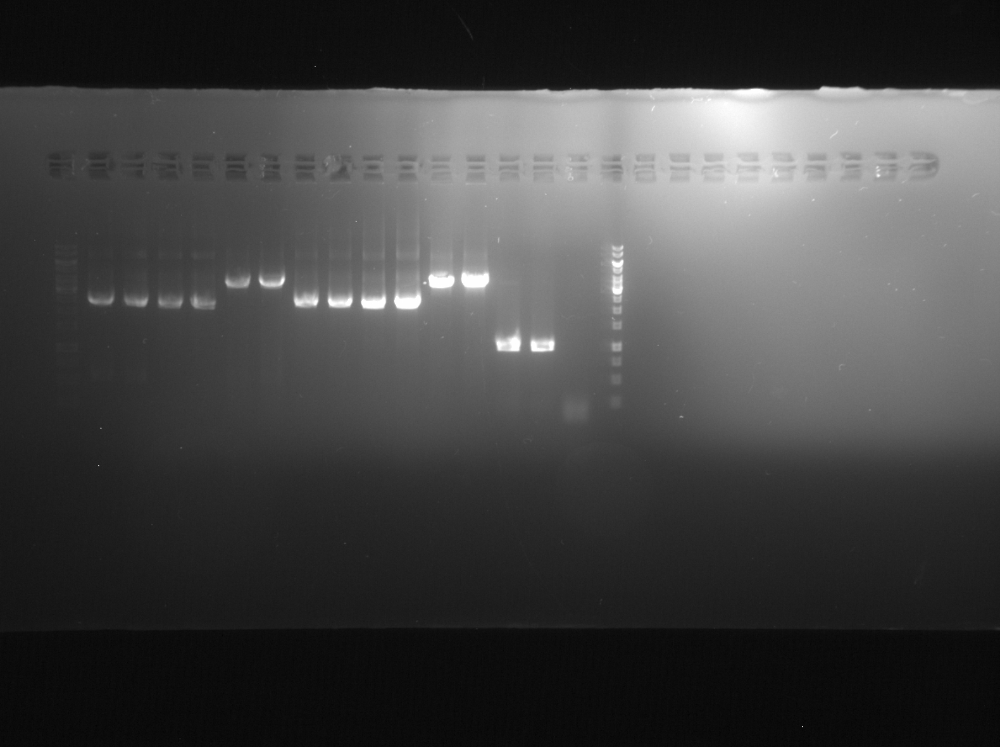

In [146]:
IPython.core.display.Image('../data/raw/001_Bioimager/2021-09_06_Q5_CPR_PRom.jpg', width=600)

The promoter was good, this wil be PCR purified. The genes have a large band in the top which might be the plasmid. Therefore the PCR is run again, but with a dilution of the template to 5 ng/ul. 

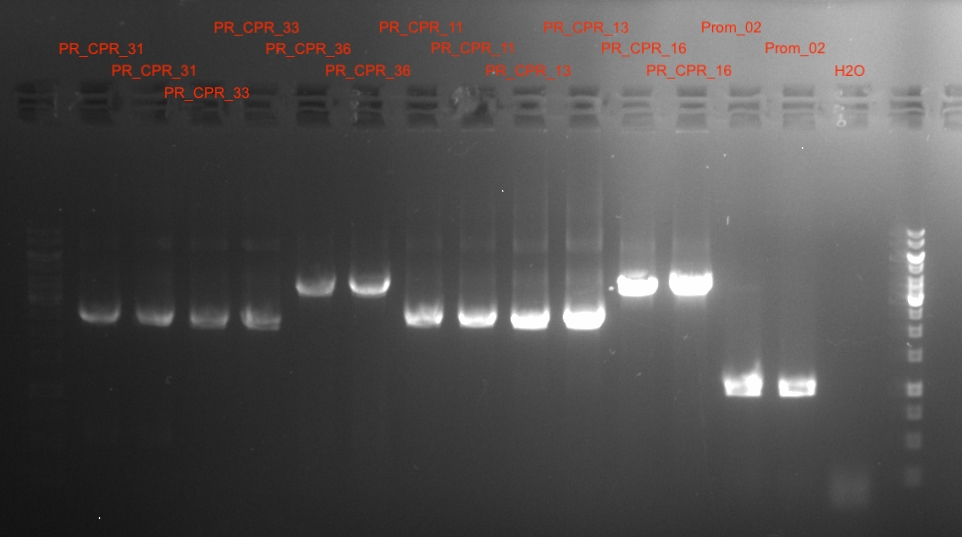

In [147]:
IPython.core.display.Image('../data/raw/001_Bioimager/2021-09_06_Q5_CPR_PRom_dark.jpg', width=600)

Redid the 13 and 16 sample again at 63 annealing tempt. 

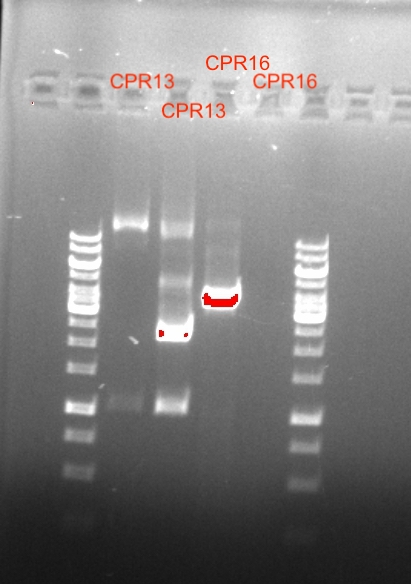

In [148]:
IPython.core.display.Image('../data/raw/001_Bioimager/2021-09_07_Q5_1316.jpg', width=300)

There was no polymerase left for CPR16-2 which explains the missing band. 

In [149]:
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['location'] = 'l6_C4'
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['concentration'] = 322
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_31', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['location'] = 'l6_C5'
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['concentration'] = 415
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_33', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['location'] = 'l6_C6'
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['concentration'] = 319
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_36', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['location'] = 'l6_C7'
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['concentration'] = 471
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_11', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['location'] = 'l6_C8'
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['concentration'] = 370
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_13', amplicons).annotations['batches']

amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['location'] = 'l6_C9'
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['concentration'] = 309
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches'][0]['volume'] = 60
amplicon_by_name('PCR_CPR_16', amplicons).annotations['batches']

amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['location'] = 'l6_B2'
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['concentration'] = 108
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['volume'] = 55
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches']

[{'location': 'l6_B2', 'volume': 55, 'concentration': 108}]

### Part Creation for the third transfomration

In [150]:
mis = ['OeuG8H_tADH1','pCCW12','pTPI1','pCYC1','pENO2','XI-2_UP','TRP1-marker','XI-2_DW']
missing_ampl = []
for frag_list_no, frag_list in enumerate(amplicon_matrix_reshaped_no_duplicates):
    #print("All parts for fragment no: " + str(frag_list_no))
    for frag in frag_list:
        if frag.part_name in mis:
            if frag.name != 'PCR_G8H_30':
                missing_ampl.append(frag)
        #print(frag.name, frag.part_name)
    #print()
    
plate_locations = []
for amplicon in missing_ampl:
    plate_locations.append([amplicon.name, 
                            amplicon.annotations['batches'][0]['location'],
                            amplicon.annotations['template_name'],
                            amplicon.template.annotations['batches'][0]['location'],
                            amplicon.forward_primer.id,
                            amplicon.forward_primer.annotations['batches'][0]['location'],
                            amplicon.reverse_primer.id,
                            amplicon.reverse_primer.annotations['batches'][0]['location']
                           ])
amplicon_e_df = pd.DataFrame(plate_locations, columns=['name', 'location','template_name','template_location','fw_name','fw_location','rv_name','rv_location'])
amplicon_e_df = amplicon_e_df.set_index('name')
amplicon_e_df


,location,template_name,template_location,fw_name,fw_location,rv_name,rv_location
name,,,,,,,
PCR_UP_tADH1_01,l5_I08,XI-2_UP,o5,PR_UP_tADH1_05,o2_I06,PR_UP_tADH1_06,o2_I07
PCR_G8H_29,l5_D04,OeuG8H_tADH1,o5,PR_G8H_01,o3_F07,PR_G8H_30,op4_A08
PCR_PRO_01,l4_C07,pCYC1,o5,PR_PRO_01,op4_A11,PR_PRO_02,op4_A12
PCR_PRO_06,l4_D03,pENO2,o5,PR_PRO_11,op4_F11,PR_PRO_12,op4_F12
PCR_PRO_04,l5_D02,pTPI1,o5,PR_PRO_07,op4_D11,PR_PRO_08,op4_D12
PCR_PRO_02,l6_B2,pCCW12,o5,PR_PRO_03,op4_B11,PR_PRO_04,op4_B12
PCR_TRP1-DW_01,l5_I07,seq_3HMRtcpy,o5,PR_TRP1-DW_01,op4_C10,PR_TRP1-DW_02,op4_D10
PCR_TRP1-DW_02,l5_I09,XI-2_DW,o5,PR_TRP1-DW_05,o2_I08,PR_TRP1-DW_06,o2_I09


In [151]:
dublicates = 3
n =(len(amplicon_e_df)*dublicates+len(amplicon_e_df)*dublicates*0.1)
pcr_volumes(vol_p_reac = 50, 
        no_of_reactions = n,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

,vol_p_reac,vol_p_26.4_reac
Template,1.0,26.4
Primer 1,2.5,66.0
Primer 2,2.5,66.0
H20,19.0,501.6
Pol,25.0,660.0
Total,50.0,1320.0


In [152]:
for ampl in missing_ampl:
    print(ampl.name)
    print(Dseqrecord(ampl.forward_primer.footprint).seq.watson)
    print(Dseqrecord(ampl.reverse_primer.footprint).seq.watson)
    print(len(ampl))

PCR_UP_tADH1_01
GAGGATTTTCGATGGAGC
TTGTGGAAGTTCATGGC
609
PCR_G8H_29
GAGCGACCTCATGCTATAC
ATGGACTTCTTAACAATCGTTTTAG
1845
PCR_PRO_01
TATTAATTTAGTGTGTGTATTTGTGTTTG
CAGCATTTTCAAAGGTGTG
1033
PCR_PRO_06
TATTATTGTATGTTATAGTATTAGTTGCTTGG
AATCCTACTCTTGCCGTTG
1046
PCR_PRO_04
AAGGATGAGCCAAGAATAAGG
TTTTAGTTTATGTATGTGTTTTTTGTAG
1043
PCR_PRO_02
AAAGAAACTTAATACGTTATGCCG
TATTGATATAGTGTTTAAGCGAATGAC
1023
PCR_TRP1-DW_01
AGACGGTCACAGCTTGTCTGTAAGC
CGTAGTGGGCCATCGCCC
1451
PCR_TRP1-DW_02
CACACGACTAGCGCT
GTGGGAAGATTCCGCT
599


59
60
59
60
60
57
71
61

PCR
- Polymerase: Q5 2x MasterMix [protocol](https://international.neb.com/protocols/2012/08/30/protocol-for-q5-hot-start-high-fidelity-2x-master-mix-m0494)
- Program: Create according to protocol
- Elongation time: 1.5 min (30 s/ kb)
- Annealing temp 60



PCR_UP_tADH1_01
PCR_G8H_29
PCR_PRO_01
PCR_PRO_06
PCR_PRO_04
PCR_PRO_02
PCR_TRP1-DW_01
PCR_TRP1-DW_02


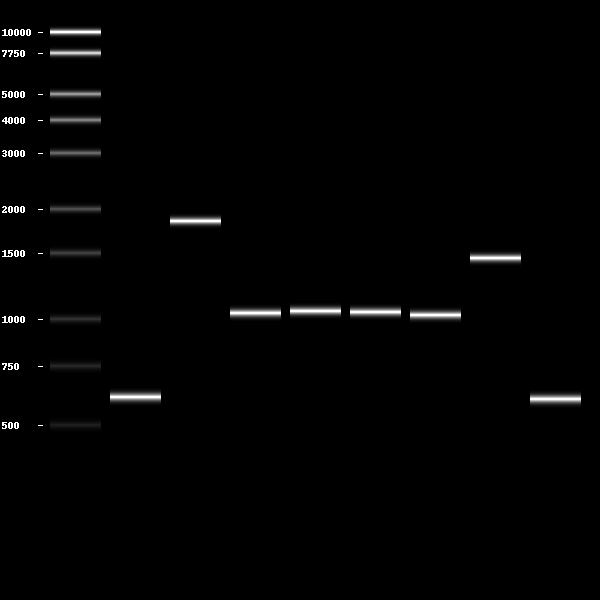

In [153]:
for band in missing_ampl:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in missing_ampl]])

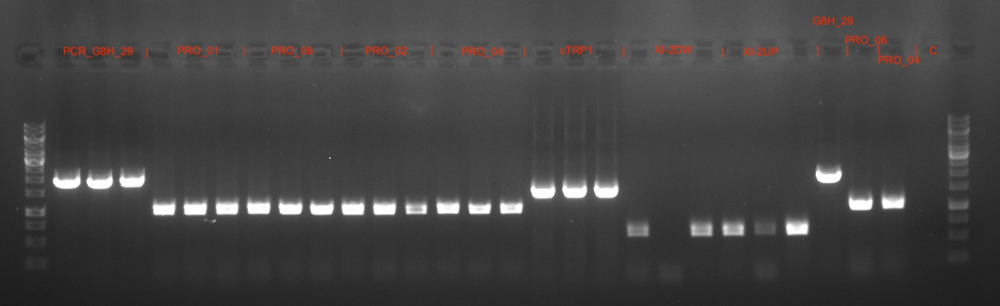

In [154]:
IPython.core.display.Image('../data/raw/001_Bioimager/2021-09_13_Q5_parts.jpg', width=700)

All parts can be purified except XI-2DW 2

# Testing growth rate
MIA-HA1-b
- First innoculation: at 15.30.
- at 08.40 next day: OD: 0.95

- kl 09.08: OD: 0.317
- kl 10.03: OD: 0,379
- kl 10.55: OD: 0.469
- kl 11.54: OD: 0.294/0.5 = 0.588
- kl 12.56: OD: 0.344/0.5 = 0.644
- kl 14.13: oD: 0.226/0.25 = 0.904
- kl 15.45: OD: 0.303/0.25 = 1.212



In [155]:
#Lists of time and OD
time = [0,(55/60), ((55+52)/60), ((55+52+59)/60), ((55+52+59+62)/60), ((55+52+59+62+77)/60), ((55+52+59+62+77+92)/60)]
OD = [0.317, 0.379, 0.469, 0.588, 0.644, 0.904, 1.212]


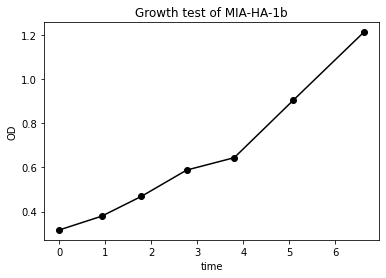

<Figure size 216x288 with 0 Axes>

In [156]:
#plot the growth rate
import matplotlib.pyplot as plt
plt.plot(time, OD, '-ok')
plt.ylabel('OD')
plt.xlabel('time')
plt.title("Growth test of MIA-HA-1b", fontdict=None, loc='center', pad=None)
plt.figure(figsize=(3,4))
plt.show()


In [157]:
time

[0,
 0.9166666666666666,
 1.7833333333333334,
 2.7666666666666666,
 3.8,
 5.083333333333333,
 6.616666666666666]

In [158]:
from constrain.lab.transformation import ODtime, wanted_mass


In [159]:
# What's the doubling time?
ODtime(initialOD = 0.3, time = 6.6, td = 0.307)

1.222

## Parts check in laboratory
Through investigatino of parts it was found that:

from Own stock I can use:
- OeuG8H_tADH1
- RsepG8H_tADH1
- VminG8H_tADH1
- SmusG8H
- AanCPR
- CloCPR
- RseCPR


from Sørens stock:
- CroG8H
- AniCPR

To be determined: 

missing:
- CroCPR
- AraCPR
- AhuCPR

Q:
- how much od I need of gRNA
- How much do I need of the up, dw, trp?
- how much promoter do I need


### Make a trial transformation 
 
Sørens pools: CcalG8H_tADH1, OeuCPR_tCYC1, CpoCPR_tCYC1
pool of promoter 7,8,3 and 5
See notebook: Check_parts


In [160]:
def wanted_mass(wanted_moles, size):
    """
    wanted moles in nmol, 
    size in bp
    
    Returns:
    in ng = nmol * bp * 650 ng/(nmol * bp)
    
    """
    w_mass = wanted_moles * size * 650
    w_mass_rounded = round(w_mass,1)
    return(w_mass_rounded)

def wanted_volume(wanted_mass, actual_concentration):
    """
    wanted mass in ng
    actual_concentration in ng/ul
    return in ul
    """
    wanted_volume = wanted_mass / actual_concentration
    wanted_volume_rounded = round(wanted_volume,1)
    return(wanted_volume_rounded)

promoters# Pools
Pool genes

pool gRNA

check amount of 

## Make promoter pool

In [164]:
#Save amounts needed and amplicons
promoters_amounts_total = 0.001*4
promoter_names = ('PCR_PRO_01','PCR_PRO_06','PCR_PRO_02','PCR_PRO_04')
promoter_parts_amounts_total = {k: v for (k, v) in zip(promoter_names,[promoters_amounts_total/8]*len(promoter_names))}
promoters = [amplicon_by_name(name,amplicons) for name in promoter_names]

#Find volume needed
volumes = []
ngs = []
for amp in promoters:
    if amp.name == "PCR_PRO_01":
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = 100.0
        w_volume = wanted_volume(w_mass, act_conc)
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, w_volume, act_conc, '\t',amp.annotations['batches'][0]['location'])
    else:
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = amp.annotations['batches'][0]['concentration']
        w_volume = wanted_volume(w_mass, act_conc)
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, w_volume, act_conc, '\t', amp.annotations['batches'][0]['location'])

#Count total concentrtaion expected    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc = total_ngs/total_vol
print('total volume: ', sum(volumes))
print()
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)



#multiply with n if more is needed
n=9
print("\n",n," amount")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in promoters:
    if amp.name == "PCR_PRO_01":
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = 100.0
        w_volume = wanted_volume(w_mass, act_conc)*n
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, w_volume, act_conc, '\t',amp.annotations['batches'][0]['location'])
    else:
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = amp.annotations['batches'][0]['concentration']
        w_volume = wanted_volume(w_mass, act_conc)*n
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, round(w_volume), act_conc, '\t', amp.annotations['batches'][0]['location'])

#Count total concentrtaion expected    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print('total volume: ', sum(volumes))
print()
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)





PCR_PRO_01 3.4 100.0 	 l4_C07
PCR_PRO_06 3.1 110.0 	 l4_D03
PCR_PRO_02 3.1 108 	 l6_B2
PCR_PRO_04 4.7 72 	 l5_D02
total volume:  14.3

total ngs:  1354.2
total conc:  94.6993006993007

 9  amount
name, volume, concentration, location
PCR_PRO_01 30.599999999999998 100.0 	 l4_C07
PCR_PRO_06 28 110.0 	 l4_D03
PCR_PRO_02 28 108 	 l6_B2
PCR_PRO_04 42 72 	 l5_D02
total volume:  128.70000000000002

total ngs:  12187.800000000001
total conc:  94.6993006993007


In [165]:
#After more amplifications
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['location'] = 'l6_B2'
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['concentration'] = 81
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['volume'] = 80
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches']

amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['location'] = 'l6_B3'
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['concentration'] = 75
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['volume'] = 80
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches']

amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['location'] = 'l6_B4'
amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['concentration'] = 88
amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['volume'] = 80
amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches']

amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['location'] = 'l6_B1'
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['concentration'] = 90
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['volume'] = 80
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches']

#There was not enough in 02. so a new batch was made 
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['location'] = 'l6_B2'
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['concentration'] = 108
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['volume'] = 55
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches']

[{'location': 'l6_B2', 'volume': 55, 'concentration': 108}]

In [166]:
#Save amounts needed and amplicons
promoters_amounts_total = 0.001*4 
promoter_names = ('PCR_PRO_01','PCR_PRO_06','PCR_PRO_02','PCR_PRO_04')
promoter_parts_amounts_total = {k: v for (k, v) in zip(promoter_names,[promoters_amounts_total/8]*len(promoter_names))}
promoters = [amplicon_by_name(name,amplicons) for name in promoter_names]

#Find volume needed
volumes = []
ngs = []
for amp in promoters:
    if amp.name == "PCR_PRO_01":
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = 100.0
        w_volume = wanted_volume(w_mass, act_conc)
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, w_volume, act_conc, '\t',amp.annotations['batches'][0]['location'])
    else:
        w_moles = promoter_parts_amounts_total[amp.name]
        w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
        act_conc = amp.annotations['batches'][0]['concentration']
        w_volume = wanted_volume(w_mass, act_conc)
        volumes.append(w_volume)
        ngs.append(w_volume * act_conc)
        print(amp.name, w_volume, act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc = total_ngs/total_vol
print('total volume: ', sum(volumes))
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)


print("\nfirst pool")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in promoters:

    w_moles = promoter_parts_amounts_total[amp.name]
    w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
    act_conc = amp.annotations['batches'][0]['concentration']
    w_volume = wanted_volume(w_mass, act_conc)*9
    volumes.append(w_volume)
    ngs.append(w_volume * act_conc)
    print(amp.name, round(w_volume), act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print('total volume: ', sum(volumes))
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)

#There was not enough in the first pool, so a little extra was made
print("\nextra first pool")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in promoters:

    w_moles = promoter_parts_amounts_total[amp.name]
    w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
    act_conc = amp.annotations['batches'][0]['concentration']
    w_volume = wanted_volume(w_mass, act_conc)*(10.5-9)
    volumes.append(w_volume)
    ngs.append(w_volume * act_conc)
    print(amp.name, round(w_volume), act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print('total volume: ', sum(volumes))
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)

#Second pool
print("\nsecond pool")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in promoters:

    w_moles = promoter_parts_amounts_total[amp.name]
    w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
    act_conc = amp.annotations['batches'][0]['concentration']
    w_volume = wanted_volume(w_mass, act_conc)*7
    volumes.append(w_volume)
    ngs.append(w_volume * act_conc)
    print(amp.name, round(w_volume,2), act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print('total volume: ', sum(volumes))
print()
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)


PCR_PRO_01 3.4 100.0 	 l6_B1
PCR_PRO_06 3.9 88 	 l6_B4
PCR_PRO_02 3.1 108 	 l6_B2
PCR_PRO_04 4.5 75 	 l6_B3
total volume:  14.9
total ngs:  1355.5
total conc:  90.97315436241611

first pool
name, volume, concentration, location
PCR_PRO_01 33 90 	 l6_B1
PCR_PRO_06 35 88 	 l6_B4
PCR_PRO_02 28 108 	 l6_B2
PCR_PRO_04 40 75 	 l6_B3
total volume:  136.8
total ngs:  12136.500000000002
total conc:  90.97315436241611

extra first pool
name, volume, concentration, location
PCR_PRO_01 6 90 	 l6_B1
PCR_PRO_06 6 88 	 l6_B4
PCR_PRO_02 5 108 	 l6_B2
PCR_PRO_04 7 75 	 l6_B3
total volume:  22.8
total ngs:  2022.75
total conc:  90.97315436241611

second pool
name, volume, concentration, location
PCR_PRO_01 25.9 90 	 l6_B1
PCR_PRO_06 27.3 88 	 l6_B4
PCR_PRO_02 21.7 108 	 l6_B2
PCR_PRO_04 31.5 75 	 l6_B3
total volume:  106.4

total ngs:  9439.5
total conc:  90.97315436241611


In [168]:
from constrain.lab.PCR import nanophotometer_concentrations

## Pool Parts

### Sørens pools
These are included as some of his parts were still available

In [176]:
#Code from Sørens part
#Concentrations measured by søren
pool_concentrations = nanophotometer_concentrations( '../data/raw/005_Nanophotometer/2021-03-29_G8H_CPR_library_part_concentrations.tsv')

# pool 2 promoter samples 88,77.6 into 82.8
concs = pool_concentrations[-5:-3]
concs_mean = sum(concs) / len(concs)
pool_concentrations = [conc for conc in pool_concentrations if conc not in concs]
pool_concentrations.insert(-3, concs_mean)
len(pool_concentrations)


# pool equimolar ratio
promoter_conc = [100,100,100,90,120,110,75,120]

# pool all, fragments are the same, same length
UP_concs = [40, 30, 30, 35, 23.7]
DW_concs = [60, 60, 40, 50, 17.5]
cTRP_concs = [160, 150, 140, 39.9]

#Information
pool_names = ['VminG8H_tADH1','SmusG8H_tADH1','RsepG8H_tADH1','CacuG8H_tADH1','OpumG8H_tADH1','CroG8H_tADH1','PcoG8H_tADH1','OeuG8H_tADH1','CcalG8H_tADH1','CroCPR_tCYC1','AanCPR_tCYC1','AraCPR_tCYC1','CloCPR_tCYC1','RseCPR_tCYC1','AhuCPR_tCYC1','AniCPR_tCYC1','CacCPR_tCYC1','OeuCPR_tCYC1','CpoCPR_tCYC1','Promoters_pool','XI-2_UP','XI-2_DW','cTRP1']
pool_lengths = [1845,1851,1845,1869,1902,1737,1412,1845,1845,2365,2335,2300,2365,2365,2365,2305,2347,2347,2260,1033,609,599,1451]
pool_bases = ['A'* pool_length for pool_length in pool_lengths]
pool_positions = ['F7','F8','F9','G1','G2','G3','G4','G5','G6','G7','G8','G9','H1','H2','H3','H4','H5','H6','H7','H8','H9','I1','I2']

# Update due pooling with previously made batches
pool_bases[-3] = amplicon_by_name('PCR_UP_tADH1_01',amplicons).seq.watson # UP
pool_bases[-2] = amplicon_by_name('PCR_TRP1-DW_02',amplicons).seq.watson # DW
pool_bases[-1] = amplicon_by_name('PCR_TRP1-DW_01',amplicons).seq.watson # cTRP

pool_concentrations[-3] = mean(UP_concs)
pool_concentrations[-2] = mean(DW_concs)
pool_concentrations[-1] = mean(cTRP_concs)

pool_volumes = [100] * len(pool_names)
pool_volumes[-3] = 100 * len(UP_concs) # UP
pool_volumes[-2] = 100 * len(DW_concs) # DW
pool_volumes[-1] = 100 * len(cTRP_concs) # cTRP



In [177]:
#Remove the parts not usefull in this project
parts_not_to_include = ['CacuG8H_tADH1','OpumG8H_tADH1','PcoG8H_tADH1','CcalG8H_tADH1','CacCPR_tCYC1','OeuCPR_tCYC1','CpoCPR_tCYC1']
for i in range(len(pool_names)-1, 0, -1):
    if pool_names[i] in parts_not_to_include:
        pool_names.pop(i)
        pool_lengths.pop(i)
        pool_bases.pop(i)
        pool_positions.pop(i)
        pool_volumes.pop(i)
        pool_concentrations.pop(i)

In [178]:
#Create a dictionary that holds all the information
pools ={}
for i in range(len(pool_names)):
    pools[pool_names[i]] = {'concentration':pool_concentrations[i], 'pool_lengths':pool_lengths[i], 'pool_bases': pool_bases[i], 'pool_volumes':pool_volumes[i], 'pool_positions':pool_positions[i]}

In [179]:
#Print names
for name in pool_names:
    print(name)

VminG8H_tADH1
SmusG8H_tADH1
RsepG8H_tADH1
CroG8H_tADH1
OeuG8H_tADH1
CroCPR_tCYC1
AanCPR_tCYC1
AraCPR_tCYC1
CloCPR_tCYC1
RseCPR_tCYC1
AhuCPR_tCYC1
AniCPR_tCYC1
Promoters_pool
XI-2_UP
XI-2_DW
cTRP1


### What to pool in the lab

In [180]:
#Pooling of parts from previous experiemtns
parts_available = ['OeuG8H_tADH1','RsepG8H_tADH1','VminG8H_tADH1','SmusG8H_tADH1', 'AanCPR_tCYC1','CloCPR_tCYC1','RseCPR_tCYC1']
amount = 0.0015
pool_volumes_2 = {}

#Iterate through the parts that are avilable
for amplicon in amplicons:
    if amplicon.part_name in parts_available:
        if amplicon.part_name in pool_names:
            if amplicon.part_name == 'CroG8H_tADH1':
                amount = 0.0022
            elif amplicon.part_name == 'RseCPR_tCYC1':
                amount = 0.0014
            elif amplicon.part_name == 'OeuG8H_tADH1':
                amount = 0.002
            elif amplicon.part_name == 'RsepG8H_tADH1':
                amount = 0.0022
            elif amplicon.part_name == 'SmusG8H_tADH1':
                amount = 0.0021
            elif amplicon.part_name == 'VminG8H_tADH1':
                amount = 0.0021
            else:
                amount = 0.0015

            ind = pool_names.index(amplicon.part_name)

            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']

            if amplicon.part_name in pool_volumes_2:
                pool_volumes_2[amplicon.part_name][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2[amplicon.part_name] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}


        elif amplicon.part_name == 'AthATR1_tCYC1':
            ind = pool_names.index('AraCPR_tCYC1')
            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']
            if 'AraCPR_tCYC1' in pool_volumes_2:
                pool_volumes_2['AraCPR_tCYC1'][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2['AraCPR_tCYC1'] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}

print("To be pooled together")
con_per_part = {}
for key in pool_volumes_2:
    print(key)
    total_vol = 0
    total_con = 0
    total_ng = 0
    for ke in pool_volumes_2[key]:
        print(ke, pool_volumes_2[key][ke])
        total_vol += pool_volumes_2[key][ke]['volume_to_mix']
        total_con +=pool_volumes_2[key][ke]['concentration']
        total_ng += pool_volumes_2[key][ke]['concentration']*pool_volumes_2[key][ke]['volume_to_mix']
    print("vol",round(total_vol,1))
    print("calculated con", total_ng/total_vol, '\n')
    con_per_part[key] = round(total_ng/total_vol)
    total_con=0
    total_vol = 0
    total_ng=0

To be pooled together
RsepG8H_tADH1
PCR_G8H_09 {'volume_to_mix': 48.0, 'location': 'l5_B02', 'concentration': 55.0}
PCR_G8H_10 {'volume_to_mix': 52.8, 'location': 'l5_B03', 'concentration': 50.0}
vol 100.8
calculated con 52.38095238095238 

SmusG8H_tADH1
PCR_G8H_05 {'volume_to_mix': 63.2, 'location': 'l5_A07', 'concentration': 40.0}
PCR_G8H_06 {'volume_to_mix': 45.9, 'location': 'l5_A08', 'concentration': 55.0}
vol 109.1
calculated con 46.31072410632448 

VminG8H_tADH1
PCR_G8H_01 {'volume_to_mix': 63.0, 'location': 'l5_A03', 'concentration': 40.0}
PCR_G8H_02 {'volume_to_mix': 56.0, 'location': 'l5_A04', 'concentration': 45.0}
vol 119.0
calculated con 42.35294117647059 

OeuG8H_tADH1
PCR_G8H_29 {'volume_to_mix': 80.0, 'location': 'l5_D04', 'concentration': 30.0}
PCR_G8H_30 {'volume_to_mix': 53.3, 'location': 'l5_D05', 'concentration': 45.0}
vol 133.3
calculated con 35.99774943735934 

AanCPR_tCYC1
PCR_CPR_20 {'volume_to_mix': 65.0, 'location': 'l5_E08', 'concentration': 35.0}
PCR_CPR_40

In [181]:
#save the information from the pool (measured concentrations)
New_pools={'OeuG8H_tADH1':{'pool_location': 'l5_E04', 'pool_concentration':42},'RsepG8H_tADH1':{'pool_location': 'l5_E03', 'pool_concentration':56}, 'VminG8H_tADH1':{'pool_location': 'l4_D01', 'pool_concentration':49}, 'SmusG8H_tADH1':{'pool_location': 'l5_E05', 'pool_concentration':54},'AanCPR_tCYC1':{'pool_location': 'l5_E06', 'pool_concentration':43},'CloCPR_tCYC1':{'pool_location': 'l5_I08', 'pool_concentration':35}, 'RseCPR_tCYC1':{'pool_location': 'l5_C09', 'pool_concentration':34},'Promoters_pool':{'pool_location': 'l6_B05', 'pool_concentration':83}}
#Add the new pools to the assembly dicts
for part in New_pools:
    if part in pools:
        pools[part]['pool_positions'] = New_pools[part]['pool_location']
        pools[part]['concentration'] = New_pools[part]['pool_concentration']



First I did one pool with CPR, Ara and Ahu, but the concentrations were too low and the wuality of the parts were not good enough. Therefor a second round was made with new pools

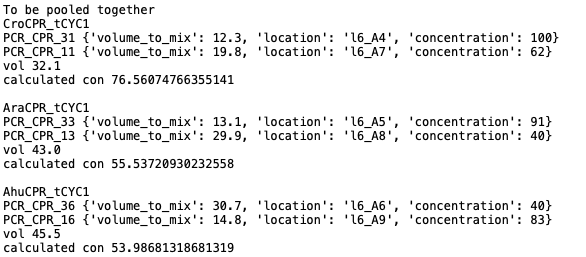

In [184]:
#The first pool of Cro Ara and Ahu
IPython.core.display.Image('../data/interim/Fist_pool_CroAraAhu.png', width=800)

In [185]:
#Pooling of parts from previous experiemtns
#Find the amount to be pooled
amount = 0.004
pool_volumes_2 = {}
#Iterate through the amplicons and calculate the 
for amplicon in amplicons:
    if amplicon.part_name in parts_created:
        if amplicon.part_name in pool_names:
            amount = 0.003
            ind = pool_names.index(amplicon.part_name)
            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']
            if amplicon.part_name in pool_volumes_2:
                pool_volumes_2[amplicon.part_name][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2[amplicon.part_name] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}

        #Ath is named Ara in other lists (name inconsistency)
        elif amplicon.part_name == 'AthATR1_tCYC1':
            ind = pool_names.index('AraCPR_tCYC1')
            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']
            if 'AraCPR_tCYC1' in pool_volumes_2:
                pool_volumes_2['AraCPR_tCYC1'][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2['AraCPR_tCYC1'] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}

print("To be pooled together")
con_per_part = {}
for key in pool_volumes_2:
    print(key)
    total_vol = 0
    total_con = 0
    total_ng = 0
    for ke in pool_volumes_2[key]:
        print(ke, pool_volumes_2[key][ke])
        total_vol += pool_volumes_2[key][ke]['volume_to_mix']
        total_con +=pool_volumes_2[key][ke]['concentration']
        total_ng += pool_volumes_2[key][ke]['concentration']*pool_volumes_2[key][ke]['volume_to_mix']
    print("vol",round(total_vol,1))
    print("calculated con", total_ng/total_vol)
    ml_to_Add = total_ng/200-total_vol
    print("ul water to add", ml_to_Add)
    print("final volume",total_vol+ ml_to_Add, '\n')
    con_per_part[key] = round(total_ng/total_vol)
    total_con=0
    total_vol = 0
    total_ng=0

To be pooled together
AhuCPR_tCYC1
PCR_CPR_16 {'volume_to_mix': 14.9, 'location': 'l6_C9', 'concentration': 309}
PCR_CPR_36 {'volume_to_mix': 14.5, 'location': 'l6_C6', 'concentration': 319}
vol 29.4
calculated con 313.93197278911566
ul water to add 16.748000000000005
final volume 46.148 

AraCPR_tCYC1
PCR_CPR_13 {'volume_to_mix': 12.1, 'location': 'l6_C8', 'concentration': 370}
PCR_CPR_33 {'volume_to_mix': 10.8, 'location': 'l6_C5', 'concentration': 415}
vol 22.9
calculated con 391.2227074235808
ul water to add 21.895000000000003
final volume 44.795 

CroCPR_tCYC1
PCR_CPR_11 {'volume_to_mix': 9.8, 'location': 'l6_C7', 'concentration': 471}
PCR_CPR_31 {'volume_to_mix': 14.3, 'location': 'l6_C4', 'concentration': 322}
vol 24.1
calculated con 382.5892116182573
ul water to add 22.002000000000002
final volume 46.102000000000004 



To get a little bit lower concentration I will add water

In [186]:
#Moved down to the sencond transformation to ensure correct volume prints
#New_pools_2={'CroCPR_tCYC1':{'pool_location': 'l6_B7', 'pool_concentration':186},'AraCPR_tCYC1':{'pool_location': 'l6_B8', 'pool_concentration':205},'AhuCPR_tCYC1':{'pool_location': 'l6_B9', 'pool_concentration':234}}
#Add the new pools to the assembly dicts
#for part in New_pools_2:
#    if part in pools:
#        pools[str(part)]['pool_positions'] = New_pools_2[part]['pool_location']
#        pools[str(part)]['concentration'] = New_pools_2[part]['pool_concentration']



### Third transformation pool 
The second transfomration failed, and therefore more parts were needed. 

In [187]:
#From third part creation 13/09
amplicon_by_name('PCR_G8H_29', amplicons).annotations['batches'][0]['location'] = 'l6_A6'
amplicon_by_name('PCR_G8H_29', amplicons).annotations['batches'][0]['concentration'] = 281
amplicon_by_name('PCR_G8H_29', amplicons).annotations['batches'][0]['volume'] = 75

In [188]:
#Pooling of parts from previous experiemtns
parts_available = ['OeuG8H_tADH1','RsepG8H_tADH1','VminG8H_tADH1', 'AniCPR_tCYC1']
#Find the amount to be pooled

amount = 0.0015
pool_volumes_2 = {}
#pool_lengths_2 
for amplicon in amplicons:
    if amplicon.part_name in parts_available:
        if amplicon.part_name in pool_names:
            if amplicon.part_name == 'AniCPR_tCYC1':
                amount = 0.0006
            elif amplicon.part_name == 'OeuG8H_tADH1':
                amount = 0.0013
            elif amplicon.part_name == 'RsepG8H_tADH1':
                amount = 0.0015
            elif amplicon.part_name == 'VminG8H_tADH1':
                amount = 0.00087
            else:
                amount = 0.0015
            
            #Save pool volumes
            ind = pool_names.index(amplicon.part_name)
            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']
            if amplicon.part_name in pool_volumes_2:
                pool_volumes_2[amplicon.part_name][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2[amplicon.part_name] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}

        #Ath is named Ara in other lists (name inconsistency)
        elif amplicon.part_name == 'AthATR1_tCYC1':
            ind = pool_names.index('AraCPR_tCYC1')
            vol = (pool_lengths[ind]*650*amount)/amplicon.annotations['batches'][0]['concentration']
            if 'AraCPR_tCYC1' in pool_volumes_2:
                pool_volumes_2['AraCPR_tCYC1'][amplicon.name] = {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}
            else:
                pool_volumes_2['AraCPR_tCYC1'] = {amplicon.name: {'volume_to_mix':round(vol,1),'location':amplicon.annotations['batches'][0]['location'], 'concentration':amplicon.annotations['batches'][0]['concentration']}}

print("To be pooled together")
con_per_part = {}
for key in pool_volumes_2:
    print(key)
    total_vol = 0
    total_con = 0
    total_ng = 0
    for ke in pool_volumes_2[key]:
        print(ke, pool_volumes_2[key][ke])
        total_vol += pool_volumes_2[key][ke]['volume_to_mix']
        total_con +=pool_volumes_2[key][ke]['concentration']
        total_ng += pool_volumes_2[key][ke]['concentration']*pool_volumes_2[key][ke]['volume_to_mix']
    print("vol",round(total_vol,1))
    print("calculated con", total_ng/total_vol, '\n')
    con_per_part[key] = round(total_ng/total_vol)
    total_con=0
    total_vol = 0
    total_ng=0

To be pooled together
RsepG8H_tADH1
PCR_G8H_09 {'volume_to_mix': 32.7, 'location': 'l5_B02', 'concentration': 55.0}
PCR_G8H_10 {'volume_to_mix': 36.0, 'location': 'l5_B03', 'concentration': 50.0}
vol 68.7
calculated con 52.379912663755455 

VminG8H_tADH1
PCR_G8H_01 {'volume_to_mix': 26.1, 'location': 'l5_A03', 'concentration': 40.0}
PCR_G8H_02 {'volume_to_mix': 23.2, 'location': 'l5_A04', 'concentration': 45.0}
vol 49.3
calculated con 42.352941176470594 

OeuG8H_tADH1
PCR_G8H_29 {'volume_to_mix': 5.5, 'location': 'l6_A6', 'concentration': 281}
PCR_G8H_30 {'volume_to_mix': 34.6, 'location': 'l5_D05', 'concentration': 45.0}
vol 40.1
calculated con 77.36907730673316 

AniCPR_tCYC1
PCR_CPR_17 {'volume_to_mix': 30.0, 'location': 'l5_H01', 'concentration': 30.0}
PCR_CPR_37 {'volume_to_mix': 30.0, 'location': 'l5_H03', 'concentration': 30.0}
vol 60.0
calculated con 30.0 



In [189]:
#From part creation 13/09
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['location'] = 'l6_D1'
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['concentration'] = 147
amplicon_by_name('PCR_PRO_01', amplicons).annotations['batches'][0]['volume'] = 75


amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['location'] = 'l6_D2'
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['concentration'] = 122
amplicon_by_name('PCR_PRO_02', amplicons).annotations['batches'][0]['volume'] = 75


amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['location'] = 'l6_B3'
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['concentration'] = 170
amplicon_by_name('PCR_PRO_04', amplicons).annotations['batches'][0]['volume'] = 75


amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['location'] = 'l6_B4'
amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['concentration'] = 206
amplicon_by_name('PCR_PRO_06', amplicons).annotations['batches'][0]['volume'] = 75

In [190]:
#promoter information and pools
promoters_amounts_total = 0.001*4 
promoter_names = ('PCR_PRO_01','PCR_PRO_02','PCR_PRO_04','PCR_PRO_06')
promoter_parts_amounts_total = {k: v for (k, v) in zip(promoter_names,[promoters_amounts_total/4]*len(promoter_names))}
promoters = [amplicon_by_name(name,amplicons) for name in promoter_names]

print("Promoter pool")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in promoters:
    w_moles = promoter_parts_amounts_total[amp.name]
    w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
    act_conc = amp.annotations['batches'][0]['concentration']
    w_volume = wanted_volume(w_mass, act_conc)*10
    volumes.append(w_volume)
    ngs.append(w_volume * act_conc)
    print(amp.name, round(w_volume), act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print('total volume: ', sum(volumes))
print()
print('total ngs: ', sum(ngs))
print('total conc: ', total_conc)

Promoter pool
name, volume, concentration, location
PCR_PRO_01 46 147 	 l6_D1
PCR_PRO_02 55 122 	 l6_D2
PCR_PRO_04 40 170 	 l6_B3
PCR_PRO_06 33 206 	 l6_B4
total volume:  174.0

total ngs:  27070.0
total conc:  90.97315436241611


In [191]:
#From Part Creation 13/09
amplicon_by_name('PCR_TRP1-DW_01', amplicons).annotations['batches'][0]['location'] = 'l6_D3'
amplicon_by_name('PCR_TRP1-DW_01', amplicons).annotations['batches'][0]['concentration'] = 240
amplicon_by_name('PCR_TRP1-DW_01', amplicons).annotations['batches'][0]['volume'] = 75

amplicon_by_name('PCR_TRP1-DW_02', amplicons).annotations['batches'][0]['location'] = 'l6_D4'
amplicon_by_name('PCR_TRP1-DW_02', amplicons).annotations['batches'][0]['concentration'] = 61
amplicon_by_name('PCR_TRP1-DW_02', amplicons).annotations['batches'][0]['volume'] = 75

amplicon_by_name('PCR_UP_tADH1_01', amplicons).annotations['batches'][0]['location'] = 'l6_D5'
amplicon_by_name('PCR_UP_tADH1_01', amplicons).annotations['batches'][0]['concentration'] = 82
amplicon_by_name('PCR_UP_tADH1_01', amplicons).annotations['batches'][0]['volume'] = 75

In [192]:
#pool new up and dw and trp
updw_amount = 0.001
updw_names = ('PCR_UP_tADH1_01', 'PCR_TRP1-DW_01', 'PCR_TRP1-DW_02')
updw_parts_amounts_total = {k: v for (k, v) in zip(updw_names,[updw_amount]*len(updw_names))}
updw = [amplicon_by_name(name,amplicons) for name in updw_names]

n=10
print("\n", n," amount")
print("name, volume, concentration, location")
volumes = []
ngs = []
for amp in updw:
    w_moles = updw_parts_amounts_total[amp.name]
    w_mass = wanted_mass(wanted_moles=w_moles, size=len(amp))
    act_conc = amp.annotations['batches'][0]['concentration']
    w_volume = wanted_volume(w_mass, act_conc)*n
    volumes.append(w_volume)
    ngs.append(w_volume * act_conc)
    print(amp.name, round(w_volume), act_conc, '\t', amp.annotations['batches'][0]['location'])

    
total_vol = sum(volumes)
total_ngs = sum(ngs)
total_conc_prom = total_ngs/total_vol
print()
for i in range(len(updw_names)):
    print(updw_names[i], 'con', ngs[i]/total_vol)
    
print(total_vol)



 10  amount
name, volume, concentration, location
PCR_UP_tADH1_01 48 82 	 l6_D5
PCR_TRP1-DW_01 39 240 	 l6_D3
PCR_TRP1-DW_02 64 61 	 l6_D4

PCR_UP_tADH1_01 con 26.066225165562916
PCR_TRP1-DW_01 con 61.98675496688742
PCR_TRP1-DW_02 con 25.85430463576159
151.0


In [193]:
#THis part has been moved down to the third transformation to not mess up the prints 
#New_pools_3={'XI-2_DW':{'pool_location': 'l6_B6', 'pool_concentration':25},'Promoters_pool':{'pool_location': 'l6_B5', 'pool_concentration':163},'VminG8H_tADH1':{'pool_location': 'l6_D8', 'pool_concentration':45},'RsepG8H_tADH1':{'pool_location': 'l6_D7', 'pool_concentration':61},'OeuG8H_tADH1':{'pool_location': 'l6_D6', 'pool_concentration':83},'AniCPR_tCYC1':{'pool_location': 'l6_D9', 'pool_concentration':32}}#Add the new pools to the assembly dicts
#for part in New_pools_3:
#    if part in pools:
#        pools[str(part)]['pool_positions'] = New_pools_3[part]['pool_location']
#        pools[str(part)]['concentration'] = New_pools_3[part]['pool_concentration']



# Assemblies

The following will simulate the assemblies through homologous recombiantion.

In [194]:
#Create a list of parts to be used
cro_strain_batches={'entity_name':[],'Bases':[], 'Box_barcode':[], 'position':[],'volume':[], 'volume unit':[],'concentration':[], 'concentration unit':[] }

for name in pool_names:
    cro_strain_batches['entity_name'].append(name)
    cro_strain_batches['Bases'].append(pools[name]['pool_bases'])
    cro_strain_batches['Box_barcode'].append('81BOX827')
    cro_strain_batches['position'].append(pools[name]['pool_positions'])
    cro_strain_batches['volume'].append(pools[name]['pool_volumes'])
    cro_strain_batches[ 'volume unit'].append('ul')
    cro_strain_batches['concentration'].append(pools[name]['concentration'])
    cro_strain_batches['concentration unit'].append('ng/ul')
cro_strain_batches = pd.DataFrame.from_dict(cro_strain_batches)

In [195]:
cro_strain_batches

,entity_name,Bases,Box_barcode,position,volume,volume unit,concentration,concentration unit
0,VminG8H_tADH1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l4_D01,100,ul,49.000,ng/ul
1,SmusG8H_tADH1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_E05,100,ul,54.000,ng/ul
2,RsepG8H_tADH1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_E03,100,ul,56.000,ng/ul
3,CroG8H_tADH1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,G3,100,ul,144.600,ng/ul
4,OeuG8H_tADH1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_E04,100,ul,42.000,ng/ul
5,CroCPR_tCYC1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,G7,100,ul,141.500,ng/ul
6,AanCPR_tCYC1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_E06,100,ul,43.000,ng/ul
7,AraCPR_tCYC1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,G9,100,ul,111.700,ng/ul
8,CloCPR_tCYC1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_I08,100,ul,35.000,ng/ul
9,RseCPR_tCYC1,AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA...,81BOX827,l5_C09,100,ul,34.000,ng/ul


In [205]:
#Extract the names from list and sequences from benchling
cro_UP_names       = pool_names[13:14]
cro_G8H_names      = pool_names[0:5]
cro_CPR_names      = pool_names[5:12]
cro_marker_names   = pool_names[15:16]
cro_DW_names       = pool_names[14:15]
cro_promoter_names = pool_names[12:13]

cro_marker_names

['cTRP1']

In [208]:
# Homologs
pool_G8H_sites = [site for name in cro_G8H_names for site in G8H_sites if name in site.name]
pool_CPR_sites = [site for name in cro_CPR_names for site in CPR_sites if name in site.name]

# promotes
pool_promoter_sites = pool_promoter_sites = [SeqIO.read('../data/promoter_FASTA_files/pooled_promoters.fasta', 'fasta')]

# UP, DW, marker
pool_UP_sites = UP_sites    #[site for name in cro_UP_names for site in UP_sites if name in site.name]
pool_DW_sites = DW_sites    #[site for name in cro_DW_names for site in DW_sites if name in site.name]
pool_marker_sites = marker_sites


In [211]:
#Create a list of fragments within a list of parts.
pool_fragment_list = [pool_UP_sites,pool_G8H_sites,pool_promoter_sites,pool_CPR_sites,pool_marker_sites,pool_DW_sites]

#The number of fragments to be assembled
pool_no_frags = len(pool_fragment_list)
print("Number of fragments:", pool_no_frags)

#The number of parts of each fragment
pool_no_parts = [len(l) for l in pool_fragment_list]
print("Number of parts: ",pool_no_parts)

#The number of possible combinations
pool_no_combs = multiplyList(pool_no_parts)
print("Number of possible combinations:",pool_no_combs)

#How many repitions are needed?
pool_repetition_list = [int(pool_no_comb/pool_no_part) for pool_no_comb, pool_no_part in zip([pool_no_combs]*len(pool_no_parts),pool_no_parts)]
print("The number of time each fragment must be repeated:", pool_repetition_list)

times_needed = {}
for frag_list, rep in zip(pool_fragment_list, pool_repetition_list):
    for frag in frag_list:
        times_needed.update({frag.name : rep})


#Matrix with all combinations
print("\nCombinations:")
pool_combinations_matrix = [t for t in itertools.product(*pool_fragment_list)]
for row in pool_combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)

Number of fragments: 6
Number of parts:  [1, 5, 1, 7, 1, 1]
Number of possible combinations: 35
The number of time each fragment must be repeated: [35, 7, 35, 5, 35, 35]

Combinations:
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'CroCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'AanCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'AraCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'CloCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'RseCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'AhuCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'VminG8H_tADH1', 'seq_3bqXE4zg', 'AniCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'SmusG8H_tADH1', 'seq_3bqXE4zg', 'CroCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'SmusG8H_tADH1', 'seq_3bqXE4zg', 'AanCPR_tCYC1', 'seq_3HMRtcpy', 'XI-2_DW']
['XI-2_UP', 'SmusG8H_tA

The reason for CPR fist in the list was because CPRs were the missing part and to easen the division, the setup was changed. 

In [212]:
#Save pool names and then create reaction names
pool_assembly_names       = ["MIA-HA-" + str(i+111) for i in range(0,len(pool_combinations_matrix))]
pool_assembly_names_short = ["HA" + str(i+111) for i in range(0,len(pool_combinations_matrix))]
reaction_names = pool_assembly_names_short + ['n.ctr','p.ctr','p.ctr']

In [213]:
#Define what to add to each reaction
reaction_participants = []
for row in pool_combinations_matrix:
    temp = []
    for ele in row:
        temp.append(ele)
    temp.append(pgRNA)
    reaction_participants.append(temp)

#The control mixes
reaction_participants.append([pgRNA, TRP_plasmid]) # n.ctr
reaction_participants.append([URA_plasmid, TRP_plasmid]) #p.ctr
reaction_participants.append([])  #p.ctr

#Define the media for each transformant
media = ['SC-UT'] * len(pool_assembly_names)
media = media + ['SC-UT'] * 2 # controls
media = media + ['YPD'] # controls

In [219]:
for annotation in reaction_participants: 
    for p in annotation: 
        p.annotations['batches'] = [{'location'    :'reactions_box',
                                     'volume'       : 100,
                                     'concentration': 100}]

In [220]:
# to allow UP, DW and TRP to still be in the matrix, they al got the same location, and only one of them with a low concentration. The high concentration facilitate a volume print of 0.
for part in reaction_participants:
    for p in part:
        if p.name == 'XI-2_UP':
            p.annotations['batches'][0]['concentration'] = 11
            p.annotations['batches'][0]['position'] = 'I9'
        elif p.name == 'cTRP1' or p.name == 'XI-2_DW':
            p.annotations['batches'][0]['position'] = 'I9'
            p.annotations['batches'][0]['concentration'] = 1000000 #as this is a part of XI-2_UP
        elif p.name in pools:
            p.annotations['batches'][0]['position'] = pools[p.name]['pool_positions']
            p.annotations['batches'][0]['concentration'] = pools[p.name]['concentration'] 
            

In [221]:
#Print to check con
for part in reaction_participants:
    for p in part:
        print(p.name, p.annotations['batches'][0]['concentration'])

XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
CroCPR_tCYC1 141.5
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
AanCPR_tCYC1 43
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
AraCPR_tCYC1 111.7
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
CloCPR_tCYC1 35
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
RseCPR_tCYC1 34
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
AhuCPR_tCYC1 120.2
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
VminG8H_tADH1 49
seq_3bqXE4zg 100
AniCPR_tCYC1 131.2
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
SmusG8H_tADH1 54
seq_3bqXE4zg 100
CroCPR_tCYC1 141.5
seq_3HMRtcpy 100
XI-2_DW 1000000
pESC-URA-gRNA_XI2-2 100
XI-2_UP 11
SmusG8H_tADH1 54
seq_3bqXE4zg 

In [223]:
pcr_volumes(vol_p_reac = 360, 
        no_of_reactions = 23,
        standard_reagents = ["PEG", "LiAc_1M", "ssDNA", "water_dna"],
        standard_volumes = [240, 36, 10, 74])

,vol_p_reac,vol_p_23_reac
PEG,240.0,5520.0
LiAc_1M,36.0,828.0
ssDNA,10.0,230.0
water_dna,74.0,1702.0
Total,360.0,8280.0


In [225]:
from constrain.lab.transformation import transformation_mix

In [236]:
#First transfomration print: choose AniCPR, AanCPR, CloCPR, RseCPR
transf_idx_1 = list(range(5,10)) + list(range(15,25)) + list(range(30,38))
reaction_names_1 = [reaction_names[i] for i in transf_idx_1]
reaction_participants_1 = [reaction_participants[i] for i in transf_idx_1]

#Calculate amounts needed
amnt = 0.0005
wanted_amounts_1 = [[] for i in range(len(reaction_participants_1))]
names_matrix_1 = [[] for i in range(len(reaction_participants_1))]
for reac_no, reac in enumerate(reaction_participants_1):
    for parti_no, parti in enumerate(reac):
        names_matrix_1[reac_no].append(parti.name)
        if parti.name == 'pESC-URA-gRNA_XI2-2':
            wanted_amounts_1[reac_no].append(amnt/2)
        elif parti.name =='Promoters_pool':
            wanted_amounts_1[reac_no].append(0.00098)
        else:
            wanted_amounts_1[reac_no].append(amnt)
media_1 = [media[i] for i in transf_idx_1]

reaction_names_1

['HA116',
 'HA117',
 'HA118',
 'HA119',
 'HA120',
 'HA126',
 'HA127',
 'HA128',
 'HA129',
 'HA130',
 'HA131',
 'HA132',
 'HA133',
 'HA134',
 'HA135',
 'HA141',
 'HA142',
 'HA143',
 'HA144',
 'HA145',
 'n.ctr',
 'p.ctr',
 'p.ctr']

In [235]:
#print each transformation DNA mix
transf_names_1 = transformation_mix(reaction_names_1, reaction_participants_1, wanted_amounts = wanted_amounts_1, water_dna_p_reac = 74, media = media_1)
#transf_names_1 = transf_names_1.set_index([pd.Index([str(ID + 1) for ID in transf_idx_1])])
transf_names_1

AttributeError: 'list' object has no attribute 'get'

In [ ]:
#Print sum of all needed parts. 
transf_names_1.sum(numeric_only = True)

### Protocol
Incubated 4 * 40 ul in 4 * 20 ml ypd, and 4*4 ul from that in 80 ml ypd. This time it was taken from the stock plate. 

#### Yeast transformation

Prepare cells
- Day 1: Streak relevant strain on plate: (YPD)

- Day 2: Inoculate starter culture:
    - Tag 160 ul, masser af celler -> 80 ml
    - Tag 16 derfra > bland med 80 ml
    
- Day 3: 
    - Inoculate main from starter culture to OD 0.3 & incubate to 1<OD<1.5      5 ml main cult. / transf.
    - I do it around  0.5

PREP trans mix and parts mixes

1.	Inoculate main culture			 	(50 ml YPD; > 4 h; OD=0.3 to 1<OD<1.5)
2.	Wash cells 
1.	Pellet cells & discard fluid 		(5 min; 5000 g)
2.	Add M.Q. H2O – spin – remove  (samme mægnde som medie, 5min 5000
3.	Add M.Q. H2O – spin – remove  (samme mægnde som medie, 5min 5000
4.	add a little whater, resuspend, gently and mix all cells
5.	transfer to 14 ml falcon – 14 ml h2o - 5min 5000g
6.	trasnformation mix (vol prreaction all) resuspend (vortex
7.	take 286 ul and add to the eppedofr with dna
3.	Incubate				(45 min at 42 ᵒC)
4.	11000 g i 1 min – remove liquid (sug)
5.	dillute om 90 ul water
6.	plate on SC-UT


### Notes:
The cells grew pooly over night. OD at 0,275 at 7:30. Talked to Emil who said that they don't grow well when you have a large amount of media at innocultion (they grow better when they can sense each other). They like to be close to each other. - I might have uinnoculated the same amount of cells as we would normally innoculate for 10 ml. That might explain the low OD. 
Instead, innoculate 0,5 ml the day before, add 5 ml, and wait 4 hours (unles they dont grow a lot, wait more)
Now I will wait approx 4 h. and see how the cells are. 


at 12:30 (check paper) it was 0,157*4=0,628
Beata said that 0.8 is actually a good OD. Therefore I should just transform and use all the liquid I have.  

at 13:56 OD was 0.226*4=0.9


OD at trans time: 0.245*4 = 0.98. 
Incubated at 17:30
There were a lot of cells mixed with the transfomration mix. Tried to suspend it but there were some small clumbs. Ended up transofmring with 3,6 ml pr trnas

80 ml for 22, did not transform 35 because there was not enough. 

In [ ]:
# What's the doubling time?
utils.ODtime(initialOD = 0.275, time = 6.5, td = 0.307)

In [ ]:
# What's the doubling time?
utils.ODtime(initialOD = 0.628, time = 1.5, td = 0.307)

In [ ]:
os.path.abspath(os.getcwd())

In [ ]:
#Extract path
imagingStation   = pathlib.Path('../data/processed/012_Doc-it Imaging station/').resolve()

Pictures taken the 6th of september 2021

In [ ]:
IPython.core.display.Image(imagingStation / '2021-09-03-24_36-38.jpeg', width=600)

A possible explanation for the hight n.ctr could be that we add the trp in a plasmid, so they will be able to survive if they either make non homologus end joining or if they are never cut. If we have way to many cells pr gRNA, then these will never be cut, and then they will be able to survive, since we still have ura in the plasmid. 

In [ ]:
IPython.core.display.Image(imagingStation / '2021-09-03_6-10_25.jpeg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / '2021-09-03_18-23.jpeg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / '2021-09-03_31-34_16-17.jpeg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / '2021-09-03_restreat_HA2HA3.jpeg', width=600)

All gRNA plasmid was used, and a new batch was made. Promoters are pooled again.
the parts were pooled, but Ara suddently had very low amounts

In [ ]:
#information regardingpools made for the second transformation
New_pools_2={'pESC-URA-gRNA_XI2-2':{'pool_location': 'p1_B1', 'pool_concentration':205},'pL_01_C4_(pRS416-URA)':{'pool_location': 'orange', 'pool_concentration':200},'pL_01_C2_(pRS414-TRP)':{'pool_location': 'orange', 'pool_concentration':190},'CroCPR_tCYC1':{'pool_location': 'l6_B7', 'pool_concentration':186},'AraCPR_tCYC1':{'pool_location': 'l6_B8', 'pool_concentration':205},'AhuCPR_tCYC1':{'pool_location': 'l6_B9', 'pool_concentration':234}}

#Add the new pools to the assembly dicts
for part in reaction_participants:
    for p in part:
        if p.name in New_pools_2:
            p.annotations['batches'][0]['concentration'] = New_pools_2[p.name]['pool_concentration']
            p.annotations['batches'][0]['position'] = New_pools_2[p.name]['pool_location']
        elif p.name == 'XI-2_UP':
            p.annotations['batches'][0]['concentration'] = 11
            p.annotations['batches'][0]['position'] = 'I9'
        elif p.name == 'cTRP1' or p.name == 'XI-2_DW':
            p.annotations['batches'][0]['position'] = 'I9'
            p.annotations['batches'][0]['concentration'] = 1000000 #as this is a part of XI-2_UP
        elif p.name == 'Promoters_pool':
            p.annotations['batches'][0]['concentration'] = 83 #as this is a part of XI-2_UP

     


In [ ]:
#Print locations and concentrations
seen = []
for part in reaction_participants:
    for p in part:
        if p.name not in seen:
            print( p.name,'\t',p.annotations['batches'][0]['concentration'],'\t', p.annotations['batches'][0]['position'])
            seen.append(p.name)

In [ ]:
#Second transfomration
transf_idx_2 = list(range(0,5)) + list(range(10,15)) + list(range(25,30))+list(range(34,38))
reaction_names_2 = [reaction_names[i] for i in transf_idx_2]
reaction_participants_2 = [reaction_participants[i] for i in transf_idx_2]

#Calculate amounts needed
amnt = 0.0005
wanted_amounts_2 = [[] for i in range(len(reaction_participants_2))]
names_matrix_2 = [[] for i in range(len(reaction_participants_2))]
for reac_no, reac in enumerate(reaction_participants_2):
    for parti_no, parti in enumerate(reac):
        names_matrix_2[reac_no].append(parti.name)
        if parti.name == 'pESC-URA-gRNA_XI2-2':
            wanted_amounts_2[reac_no].append(amnt/2)
        elif parti.name =='Promoters_pool':
            wanted_amounts_2[reac_no].append(0.0012)
        else:
            wanted_amounts_2[reac_no].append(amnt)
media_2 = [media[i] for i in transf_idx_2]

#Print transfomation DNA mixes
transf_names_2 = utils.transf_locations2(reaction_names_2, reaction_participants_2, wanted_amounts = wanted_amounts_2, water_dna_p_reac = 74, media = media_2)
transf_names_2 = transf_names_2.set_index([pd.Index([str(ID + 1) for ID in transf_idx_2])])

In [ ]:
transf_names_2

In [ ]:
#Print vol needed of all parts
transf_names_2.sum(numeric_only = True)

In [ ]:
#Print transfomration mix
utils.volumes(vol_p_reac = 360, 
        no_of_reactions = 20,
        standard_reagents = ["PEG", "LiAc_1M", "ssDNA", "water_dna"],
        standard_volumes = [240, 36, 10, 74])

Transformation steps:
 
0. Inoculate starter culture 
    -	Take 40 ul and add a colony to it. suspend
    -	Take 4 ul from this mix and add it to the other tube
    -	Add up to 10 ml YPD in each
1. Inoculate main culture from starter
    -	Use ca. 2 ml pr transfomration (between 1-5 ml) -> this depends on the volume of transfomration mix and the OD -> 1X (90 trans. Mix) 4X (360 trans. Mix)
    -	1X is 1,25 ml cells of OD 1 or transformation, 4X 5 ml cells of OD1 pr tranformation
    -	1<OD<1.5
2. Prepare for rest
    -	Name plates and add plating beets 
    -	Prepare t.mix; Prepare DNA in Epp; Prepare plates (19 rør) 
3. Resuspend 3x
    -	Wash cells -> 
    -	2*60 ml - We take 50 ml in toa falcon tube with cells and ypd to wash away the ypd. 
    -	Spin down, remove ypd, poor in water (vol like ypd) spin, remove water, add H2O (25 ml), spin, remove water. Add 15 ml water, dissolve, and transfor to a new 15 ml falcon tube, spin and remove, add transfomration mix and mix thoroughly. 
4. Aliquot into epp.
    -	In eppendor tube, DNA and water is already added. (74 ul)
    -	360-74 -> 286 ul transformations mix (with cells) 
    -	Heatshock at 42 C i 45 min. 
    -	11000 g i  1 min.  - suck it up with sucking machine. 
    -	Dissolve the clean cells in water  - 90 ul H2O
    -	Dissolve and plate. 
5. Incubate 3d







The cells were inokulated in 10 * 10 ml in pre culture tubes. Due to space shortage. YPD.
MAde a test with 3 * 9 ml for one scarpe and 2 * 5 ml for one scrape

At 8.20, the cells were:
40 ul concen: 0.936 * 5 = 3.74
4 ul concn:   0.449* 4 = 1,796

Possibple explanatinos for this high concentrations: 
- I used a new YPD flask - this was much darker, and might have more nutritions. 
- I used the pre-culture flasks. There might have been more O2
- There is a possibility that I had more cells from the palte this time. 


inoculated at 8:40.
- 96 ml OD 0.315
- 96 ml OD 0.5

Look at flasks at 12.40. 
OD of 0.3 was 1.7


There is a chance that I pipeted up and down in DNA/Cell from no 1 or 2 and then used the same tip to put into the cell mass. Think I stopped at 4 and started using different tips.  The chance that I get a combiantion from those is small, as the concentration of the others are much higher.


Inoculated at 15:30. A lot of foam

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_10-09_1-11.jpg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_10-09_12-27.jpg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_10-09_28-37.jpg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_10-09_38.jpg', width=600)

This time the transfomrations did not go so well. It might be explained by the high OD and thereby the high amount of cells. in the next trial I will make sure to have around 3.5 ml OD1 pr trans.

In [ ]:
"""
for part in reaction_participants:
    for p in part:
        if p.name == 'XI-2_DW':
            p.annotations['batches'][0]['concentration'] = 25
            p.annotations['batches'][0]['position'] = 'l6_B6'
        elif p.name == 'cTRP1' or p.name == 'XI-2_UP':
            p.annotations['batches'][0]['position'] = 'l6_B6'
            p.annotations['batches'][0]['concentration'] = 1000000 #as this is a part of XI-2_UP
        elif p.name == 'Promoters_pool':
            p.annotations['batches'][0]['concentration'] = 163
        elif p.name == 'pESC-URA-gRNA_XI2-2':
            p.annotations['batches'][0]['position'] = 'p1_B1'
            p.annotations['batches'][0]['concentration'] = 205
"""            


In [ ]:
#information from the third transformation
New_pools_3={'cTRP1':{'pool_location': 'l6_B6', 'pool_concentration':10000},'XI-2_UP':{'pool_location': 'l6_B6', 'pool_concentration':10000},'XI-2_DW':{'pool_location': 'l6_B6', 'pool_concentration':25},'Promoters_pool':{'pool_location': 'l6_B5', 'pool_concentration':163},'VminG8H_tADH1':{'pool_location': 'l6_D8', 'pool_concentration':45},'RsepG8H_tADH1':{'pool_location': 'l6_D7', 'pool_concentration':61},'OeuG8H_tADH1':{'pool_location': 'l6_D6', 'pool_concentration':83},'AniCPR_tCYC1':{'pool_location': 'l6_D9', 'pool_concentration':32}}#Add the new pools to the assembly dicts

#add to pool dict
for part in reaction_participants:
    for p in part:
        if p.name in New_pools_3:
            p.annotations['batches'][0]['concentration'] = New_pools_3[p.name]['pool_concentration']
            p.annotations['batches'][0]['position'] = New_pools_3[p.name]['pool_location']

          

In [ ]:
#Third transformation (repeating the second)
transf_idx_3 = list(range(0,5)) + list(range(10,15)) + list(range(25,30))+list(range(34,38))
reaction_names_3 = [reaction_names[i] for i in transf_idx_3]
reaction_participants_3 = [reaction_participants[i] for i in transf_idx_3]

#Calculate amounts needed
amnt = 0.0005
wanted_amounts_3 = [[] for i in range(len(reaction_participants_3))]
names_matrix_3 = [[] for i in range(len(reaction_participants_3))]
for reac_no, reac in enumerate(reaction_participants_3):
    for parti_no, parti in enumerate(reac):
        names_matrix_3[reac_no].append(parti.name)
        if parti.name == 'pESC-URA-gRNA_XI2-2':
            wanted_amounts_3[reac_no].append(amnt/2)
        elif parti.name =='Promoters_pool':
            wanted_amounts_3[reac_no].append(0.0018)
        else:
            wanted_amounts_3[reac_no].append(amnt)
media_3 = [media[i] for i in transf_idx_3]

#Print transfomation DNA mixes
transf_names_3 = utils.transf_locations2(reaction_names_3, reaction_participants_3, wanted_amounts = wanted_amounts_3, water_dna_p_reac = 74, media = media_3)
transf_names_3 = transf_names_3.set_index([pd.Index([str(ID + 1) for ID in transf_idx_3])])

#Print total sum of each part
transf_names_3.sum(numeric_only = True)

In [ ]:
#print transformation mix DNA
transf_names_3

In [ ]:
#Print locations and concentrations
seen = []
for part in reaction_participants_3:
    for p in part:
        if p.name not in seen:
            print(p.name,'\t', p.annotations['batches'][0]['concentration'],'\t', p.annotations['batches'][0]['position'] )
            seen.append(p.name)

In [ ]:
#Print tranforamation mix
utils.volumes(vol_p_reac = 360, 
        no_of_reactions = 20,
        standard_reagents = ["PEG", "LiAc_1M", "ssDNA", "water_dna"],
        standard_volumes = [240, 36, 10, 74])

At 9 o'clock, 3 different OD's were inoculated
- first: from 10X -> OD 0..204*2 = 0.408 ( 8.40)
- second: from OD 10X wihite caps_ 0.052*2 = 0.208 (around 9)
- third: 0.482 from 1X kolbe (Around 9))

at 12.10:_ first 0.233*4 = 0.932

at 12.25 the same was 1.024 -> used in transfomraiton

the second was 0.206*4 = 0.824 (just below one doubling time - 

third was 0.155*4 = 062 - very high, aronuid 2 doubeling times - something must have been wrong. 


Was inoculated at 15.00 with 4 ml of OD 1 pr transfomraion  this is half the amount used in the last trasnformation

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_17-09_1-11.jpeg', width=800)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_17-09_12-27.jpeg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_17-09_28-37.jpeg', width=600)

In [ ]:
IPython.core.display.Image(imagingStation / 'Trans_17-09_38.jpeg', width=600)

This time the transformations had many more colonies that usual, and the gRNA negative control only had very few, which is different from all the other transformations. 

### Import plate designs for colony picking

In [ ]:
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp53 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="MIA-HA-116-120_126-135_141_yp53").reset_index(drop=True)
yp54 = pd.read_excel(lcms / "plateDesign_yp53-54_MIA-HA-111-145.xlsx", sheet_name="111-115_121-125_136-140-145yp54").reset_index(drop=True)
yp53.tail()

In [ ]:
yp53['prow'] = yp53['position'].str.slice(stop=-2)
yp53['pcol'] = yp53['position'].str.slice(start=-2)
utils.plate_plot(yp53, 'Strain')

In [ ]:
yp54['prow'] = yp54['position'].str.slice(stop=-2)
yp54['pcol'] = yp54['position'].str.slice(start=-2)
utils.plate_plot(yp54, 'Strain')

# Colony PCR

1.	Pick 4 colonies from all  plates and inoculate in 150 uL SC-UT, microtiter plate , grow ON in the 30oC shaker 300rpm
2.	Transfer 50ul of ON culture to 96 PCR plate, add 60ul of glycerol to the remaining 100ul. Freeze. 

3.	Make gDNA prep in 96 PCR plates

    a.	Spin down 50 µL of ON culture (2200 g, 5 min), remove the supernatant with sucker

    b.	Suspend the cells in 40 µL lysis buffer (200mM LiOAc, 1 % SDS solution).
        - (Prepare stock sol. 0.22 LiAc and mix 900 μl of it with 100 μl of 10% SDS) 
        - for the 96 well plate  0.22 LiAc well plate 3600 μl plus 400 μl of 10%SDS)

    c.	Incubate 15 min 75oC (PCR machine or heating block)

    d.	Add 120 µL EtOH (Absolute), mix

    e.	Spin down DNA and cell debris at 2200 g for 5 minutes, remove the supernatant -suck

    f.	Add 150 µL 70% EtOH, mix

    g.	Spin down DNA and cell debris at 2200 g for 5 minutes, remove the supernatant- suck

    h.	Dry the 96 well plate (in 37oC Incubator) 

    i.	Add 30 µL water or NE buffer, pipet up and down to dissolve the pellet
    
    j.	Centrifuge and remove 20ul to the new plate / safe gDNA
    
    k.  spin to remove air bubbles


 PLEASE NOTE: when removing the sticker lid, be very careful not to splash! when removing, have it a 180 degrees angle, wear gloves and kepp a tight grap close to the sticking site
 



In [ ]:
#Primers for colony PCR
pad_pG8H_fw2  = utils.from_benchling("pad_pG8H_fw2", 'Primer')
tADH1_160_rv = utils.from_benchling("ADH1_test_fw", 'Primer') #224

pad_pCPR_fw2  = utils.from_benchling("pad_pCPR_fw2", 'Primer')
tCYC1_150_rv = utils.from_benchling("CYC1_test_rv", 'Primer') #225

# Background strain. As we do not know the actual genotype (promoter combination) of the individual library colonies we are using a similar genotype to simulate PCR length.
# As the two primer pairs each should yield the amplicon of a given length just two pcr's are simulated out of 2x140 amplifications
# We are also sequencing MIA-CM-3 and MIA-CH-A2 as controls


HA2 = utils.from_benchling("MIA-HA-2")

#Amplify G8H and CPR amplicon
G8H_amplicon = pydna.amplify.pcr(tADH1_160_rv, pad_pG8H_fw2, HA2)
G8H_amplicon.name = "HA111-145 G8H"
G8H_amplicon.annotations['batches'] = [{'location':"yp53"}]

CPR_amplicon = pydna.amplify.pcr(pad_pCPR_fw2, tCYC1_150_rv, HA2)
CPR_amplicon.name = "HA111-145 CPR"
CPR_amplicon.annotations['batches'] = [{'location':"yp53"}]

#print lengths of the amplicons
len(G8H_amplicon), len(CPR_amplicon)

In [ ]:
#Print sequence of primers
tADH1_160_rv.seq, pad_pG8H_fw2.seq, pad_pG8H_fw.seq

Anneal at 47

In [ ]:
#Print sequence of primers CPR
tCYC1_150_rv.seq, pad_pCPR_fw2.seq, pad_pCPR_fw.seq

Anneal at 50


Print information about primers

In [ ]:
tADH1_160_rv.annotations['batches'], pad_pG8H_fw2.annotations['batches']

In [ ]:
tCYC1_150_rv.annotations['batches'], pad_pCPR_fw2.annotations['batches']

In [ ]:
#print pcr infomration
utils.pcr_locations1([G8H_amplicon,CPR_amplicon])

In [ ]:
# PCR mix for the first transfomraiton round for each amplification site (G8H and CPR)
# make 81 * 10 % extra to account for pipetting error 
n = 81
no_of_react = n + n/10
utils.volumes(vol_p_reac = 30, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

In [ ]:
# PCR mix for the second transfomrtion round for each amplification site (G8H and CPR)
# make x * 10 % extra to account for pipetting error 
n = 77
no_of_react = n + n/10
utils.volumes(vol_p_reac = 30, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

In [ ]:
# The total amount needed
n = 158
no_of_react = n + n/10
utils.volumes(vol_p_reac = 30, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

PCR:
run two different PCR's 
- polymerase: OneTq 60 sek/kb
- Program: touch down
- Annealing temp:
    - 51/54
- Elongation time: 
    - 2:34/3:13

In [ ]:
#Print expected gel bands
bands = [G8H_amplicon, CPR_amplicon]
for band in bands:
    print(band.name)
pydna.gel.gel([pydna.ladders.PennStateLadder,*[[band] for band in bands]])

During genomic purification I spilled some, so some of htem have a little less volume. This might have spilled into other wells, but this is doubtfull. Also, some pellet came into the last bit from A's. 

In [ ]:
#Print plate designs for PCRs 
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp53_PCR_1 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="53_PCR_1").reset_index(drop=True)
yp53_PCR_2 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="53_PCR_2").reset_index(drop=True)

In [ ]:
yp53_PCR_1['prow'] = yp53_PCR_1['PCR_pos'].str.slice(stop=-2)
yp53_PCR_1['pcol'] = yp53_PCR_1['PCR_pos'].str.slice(start=-2)
utils.plate_plot(yp53_PCR_1, 'Plate position')

In [ ]:
yp53_PCR_2['prow'] = yp53_PCR_2['PCR_pos'].str.slice(stop=-2)
yp53_PCR_2['pcol'] = yp53_PCR_2['PCR_pos'].str.slice(start=-2)
utils.plate_plot(yp53_PCR_2, 'Plate position')

In [ ]:
#results 
bioimager        = pathlib.Path('../data/processed/001_Bioimager/').resolve()
IPython.core.display.Image(bioimager / '2021-09_08_CPR_colony_PCR_1stgel_new.jpg', width=800)

In [ ]:
IPython.core.display.Image(bioimager / '2021-09_08_G8H_colony_PCR_1stgel_new.jpg', width=800)

In [ ]:
IPython.core.display.Image(utils.bioimager / '2021-09_08_CPR_colony_PCR_2ndgel_new.jpg', width=800)

In [ ]:
IPython.core.display.Image(utils.bioimager / '2021-09_08_G8H_colony_PCR_2ndgel_new.jpg', width=800)

In [ ]:
#PCR plate design for plate yp54
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp54_PCR_1 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="54_PCR_1").reset_index(drop=True)
yp54_PCR_2 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="54_PCR_2").reset_index(drop=True)

In [ ]:
yp54_PCR_1['prow'] = yp54_PCR_1['PCR_pos'].str.slice(stop=-2)
yp54_PCR_1['pcol'] = yp54_PCR_1['PCR_pos'].str.slice(start=-2)
utils.plate_plot(yp54_PCR_1, 'Plate position')

In [ ]:
yp54_PCR_2['prow'] = yp54_PCR_2['PCR_pos'].str.slice(stop=-2)
yp54_PCR_2['pcol'] = yp54_PCR_2['PCR_pos'].str.slice(start=-2)
utils.plate_plot(yp54_PCR_2, 'Plate position')

In [ ]:
#results
bioimager        = pathlib.Path('../data/processed/001_Bioimager/').resolve()
IPython.core.display.Image(bioimager / '2021-23_09_CPR_colony_PCR_1stgel_2ntrans.jpg', width=800)

In [ ]:
IPython.core.display.Image(bioimager / '2021-23_09_CPR_colony_PCR_2ndgel_2ntrans.jpg', width=800)

In [ ]:
IPython.core.display.Image(bioimager / '2021-23_09_G8H_colony_PCR_1stgel_2ndtrans.jpg', width=800)

In [ ]:
IPython.core.display.Image(bioimager / '2021-23_09_G8H_colony_PCR_2ndgel_2ntrans.jpg', width=800)

# Analytics

Preculture was innoculated noon the 14th 20 ul + 80 ypd - feed
culture inokultaed 16th at 14:50 - 10 ul culture, 500 ul YPD + feed 

TO be taken out the 22nd at 14:50

**MIA-HA-111-145_analytics_experiment**

Strains  
- YP53
    - (4 colonies * 19 plates) + 2x MIA-HA-2, 2x MIA-HA-3, 4x MIA-CH-A2, 1xMIA-CM-3 and 1xblank 
-  YP54
    - (4 colonies * 16 plates) + 2x MIA-HA-2, 2x MIA-HA-3, 4x MIA-CH-A2, 1xMIA-CM-3 and 1xblank 

Media feed: 0.2 mM geraniol & 1 mM tryptamine
1. YP + 2 % glucose + feed

Sampling times:
1. One: Day: 6

For each sampling time: 
1. Cultivation 30C, 300 rpm:
2. (Monday 10/5): Inoculate precultures. Transfer 10 of YP48 g.stock to 90 media (-feed).
3. (Wednesday 12, at 11): Inoculate maincultures. Transfer 10 of preculture to 500 media
4. (Tuesday 18, at 11): 
    Sample
     1. Transfer 10 of mainculture into 140 to measure OD (in incubator while measuring) # Skipped due to dense cultures
     2. Transfer 200 into new 96 well plate,
     3. Add 20 uL 10 mg/L caffeine stock
     4. Transfer 220 onto filter in collection plate, centrifuge (2000 g x 1 min; put collection plate in -80C) 
     5. Measure MIAs (extracellular loganin)
    Prepare standards (in its own 96wellplate)
        1. Prepare [standards](/files/reports/spreadsheets/20200728_MIA_standards_prep_scheme_v2_std_v13.xlsx)
        2. Transfer X ul Std_MM_v13 onto filter in collection plate, centrifuge (2000 g x 1 min; put collection plate in -80C)      
5. (TBD): Khem run plate
6. (TBD): Data analysis

YPD + feed
1. stocks (in absolute ethanol)
    - 100 mM geraniol (Molar mass 154.253 g·mol−1, Density 0.889 g·cm-3)
        - 154.253 mg (or 173.5 µl) in 10 mL
            $$ \frac{\frac{x mg}{154.253 mg/mmol}}{10 ml} = 0.100 mmol/ml $$
            $$0.100 mmol/ml * 10 ml * 154.253 mg/ml = 154.253 mg$$
            $$ \frac{154.253 mg}{889mg/cm} * 1000 ul/ml = 173.5 ul $$  
    - 1000 mM tryptamine (Molar mass 160.220 g·mol−1) 
        - 160.220 mg in 1 mL
            $$ 1 mmol/ml * 1 ml * 160.220 mg/mmol = 160.220 mg$$

2. Add x to 100 ml YPD
    - geraniol: 200 µl 100 mM to make 0.2 mM (500x dilution)
       $$ \frac{100000 ul}{500} = 200 ul $$
    - tryptamine: 100 µl 1000 mM to make 1 mM (1000x dilution)
       $$ \frac{100000 ul}{1000} = 100 ul $$

In [ ]:
#YP53 was reallocated due to some erros during filling in the first round
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp53_reallocated = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="yp53_reallocated").reset_index(drop=True)
yp53_reallocated .tail()

In [ ]:
yp53_reallocated

In [ ]:
yp53_reallocated['prow'] = yp53_reallocated['position'].str.slice(stop=-2)
yp53_reallocated['pcol'] = yp53_reallocated['position'].str.slice(start=-2)
utils.plate_plot(yp53_reallocated, 'old position')

In [ ]:
utils.plate_plot(yp53_reallocated, 'Strain')

savthe preculture for analytics in a new 53

## Sequencing
Sequencing was perfomed with a plate sequencing kit for crude PCR products

In [ ]:
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp53_PCR_to_seq = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="53PCR_til_sekventering").reset_index(drop=True)

yp54_PCR_to_seq = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="54PCR_til_sekventering").reset_index(drop=True)



In [ ]:
yp53_PCR_to_seq['prow'] = yp53_PCR_to_seq['new_platepos/seq'].str.slice(stop=-2)
yp53_PCR_to_seq['pcol'] = yp53_PCR_to_seq['new_platepos/seq'].str.slice(start=-2)
utils.plate_plot(yp53_PCR_to_seq, 'PCR_plate_pos')

In [ ]:
yp54_PCR_to_seq['prow'] = yp54_PCR_to_seq['Plate/seq position'].str.slice(stop=-2)
yp54_PCR_to_seq['pcol'] = yp54_PCR_to_seq['Plate/seq position'].str.slice(start=-2)
utils.plate_plot(yp54_PCR_to_seq, 'PCR_plate_pos')

Some wells had evaopuradet, and therefore, the PCRs below were redone. 

In [ ]:
utils.pcr_locations1([G8H_amplicon,CPR_amplicon])

In [ ]:
# for each amplification site (G8H and CPR)
# make 81 * 10 % extra to account for pipetting error 
n = 20
no_of_react = n + n/10
utils.volumes(vol_p_reac = 35, 
        no_of_reactions = no_of_react,
        standard_reagents = ["Template", "Primer 1", "Primer 2", "H20", "Pol"],
        standard_volumes = [1, 2.5, 2.5, 19, 25])

PCR:
run two different PCR's 
- polymerase: OneTq 60 sek/kb
- Program: touch down
- Annealing temp:
    - 51/54
- Elongation time: 
    - 2:34/3:13

In [ ]:
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
colonyPCR_for_seq = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="second_colony_for_seq").reset_index(drop=True)
colonyPCR_for_seq


In [ ]:
#Create table for latex for report
print(pd.DataFrame(colonyPCR_for_seq).to_latex())

## Reallocation of strains to be in order 
As the strains were not created in the named order, thye were rellocated to be ordered chorrectly.

In [ ]:
lcms = pathlib.Path("../data/raw/023_LC-MS/").resolve()
yp55 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="YP55").reset_index(drop=True)
yp56 = pd.read_excel(lcms / 'plateDesign_yp53-54_MIA-HA-111-145.xlsx', sheet_name="YP56").reset_index(drop=True)

In [ ]:
print("Plate 55")
yp55['prow'] = yp55['position'].str.slice(stop=-2)
yp55['pcol'] = yp55['position'].str.slice(start=-2)
utils.plate_plot(yp55, 'Illustrate')

In [ ]:
utils.plate_plot(yp55, 'Strain')

In [ ]:
print("Plate 56")
yp56['prow'] = yp56['position'].str.slice(stop=-2)
yp56['pcol'] = yp56['position'].str.slice(start=-2)
utils.plate_plot(yp56, 'Illustrate')

In [ ]:
utils.plate_plot(yp56, 'Strain')

# Redo cultivations

Due to inconsistency between some replicates, the analytics was performed again. 
YPD + feed
1. stocks (in absolute ethanol)
    - 100 mM geraniol (Molar mass 154.253 g·mol−1, Density 0.889 g·cm-3)
        - 154.253 mg (or 173.5 µl) in 10 mL
            $$ \frac{\frac{x mg}{154.253 mg/mmol}}{10 ml} = 0.100 mmol/ml $$
            $$0.100 mmol/ml * 10 ml * 154.253 mg/ml = 154.253 mg$$
            $$ \frac{154.253 mg}{889mg/cm} * 1000 ul/ml = 173.5 ul $$  
    - 1000 mM tryptamine (Molar mass 160.220 g·mol−1) 
        - 160.220 mg in 1 mL
            $$ 1 mmol/ml * 1 ml * 160.220 mg/mmol = 160.220 mg$$

2. Add x to 100 ml YPD
    - geraniol: 200 µl 100 mM to make 0.2 mM (500x dilution)
       $$ \frac{100000 ul}{500} = 200 ul $$
    - tryptamine: 100 µl 1000 mM to make 1 mM (1000x dilution)
       $$ \frac{100000 ul}{1000} = 100 ul $$

**MIA-HA_analytics_experiment**

Strains  
1. YP55+56 + YP49,50,51
    - MIA-HA-1
    - (4 colonies * 19 plates) + 2x MIA-HA-2, 2x MIA-HA-3, 4x MIA-CH-A2, 1xMIA-CM-3 and 1xblank 

Media feed: 0.2 mM geraniol & 1 mM tryptamine
1. YP + 2 % glucose + feed

Sampling times:
1. One: Day: 6

For each sampling time: 
1. Cultivation 30C, 300 rpm:
2. (Monday 18): Inoculate precultures. Transfer 10 of YP48 g.stock to 90 media (-feed).
3. (Wednesday 20): Inoculate maincultures. Transfer 10 of preculture to 500 media
4. (Tuesday 26): 
    Sample
     1. Transfer 10 of mainculture into 140 to measure OD (in incubator while measuring) # Skipped due to dense cultures
     2. Transfer 200 into new 96 well plate,
     3. Add 20 uL 10 mg/L caffeine stock
     4. Transfer 220 onto filter in collection plate, centrifuge (2000 g x 1 min; put collection plate in -80C) 
     5. Measure MIAs (extracellular loganin)
    Prepare standards (in its own 96wellplate)
        1. Prepare [standards](/files/reports/spreadsheets/20200728_MIA_standards_prep_scheme_v2_std_v13.xlsx)
        2. Transfer X ul Std_MM_v13 onto filter in collection plate, centrifuge (2000 g x 1 min; put collection plate in -80C)      
5. (week 45): Khem run plate. Due to tool breakdown, it took one day pr plate. The plates were runned after 2 weeks. 
6. (TBD): Data analysis

In [ ]:
#fetch all plates data
lcms = pathlib.Path("/Users/Christine/Documents/Speciale/g8h_cpr_library/data/")

yp49 = pd.read_excel(lcms / "raw/023_LC-MS/plateDesign_yp48-51_MIA-HA-1-17_21-100.xls", sheet_name="MIA-HA-51-80_yp49").reset_index(drop=True)
yp50 = pd.read_excel(lcms / "raw/023_LC-MS/plateDesign_yp48-51_MIA-HA-1-17_21-100.xls", sheet_name="MIA-HA-21-50_yp50").reset_index(drop=True)
yp51 = pd.read_excel(lcms / "raw/023_LC-MS/plateDesign_yp48-51_MIA-HA-1-17_21-100.xls", sheet_name="MIA-HA-81-100_yp51").reset_index(drop=True)

yp49['prow'] = yp49['position'].str.slice(stop=-2)
yp49['pcol'] = yp49['position'].str.slice(start=-2)
utils.plate_plot(yp49, 'Strain')

In [ ]:
yp50['prow'] = yp50['position'].str.slice(stop=-2)
yp50['pcol'] = yp50['position'].str.slice(start=-2)
utils.plate_plot(yp50, 'Strain')

In [ ]:
yp51['prow'] = yp51['position'].str.slice(stop=-2)
yp51['pcol'] = yp51['position'].str.slice(start=-2)
utils.plate_plot(yp51, 'Strain')

In [ ]:
utils.plate_plot(yp55, 'Strain')

In [ ]:
utils.plate_plot(yp56, 'Strain')

### Find all possible lengths and analyse colony PCR bands

In [ ]:
#All part names
UP_names      = ['PCR_UP_tADH1_01']
G8H_names     = ['PCR_G8H_29','PCR_G8H_30','PCR_G8H_21','PCR_G8H_22','PCR_G8H_09','PCR_G8H_10','PCR_G8H_01','PCR_G8H_02','PCR_G8H_05','PCR_G8H_06']
pG8H_names    = ['PCR_PRO_01','PCR_PRO_06']
pCPR_names    = ['PCR_PRO_04','PCR_PRO_02']
CPR_names     = ['PCR_CPR_31','PCR_CPR_40','PCR_CPR_33','PCR_CPR_39','PCR_CPR_32','PCR_CPR_36','PCR_CPR_37','PCR_CPR_11','PCR_CPR_20','PCR_CPR_13','PCR_CPR_19','PCR_CPR_12','PCR_CPR_16','PCR_CPR_17']
marker_names  = ['PCR_TRP1-DW_01']
DW_names      = ['PCR_TRP1-DW_02']

#Get the amplicons for these names
UP_sites      = [amplicon_by_name(name, amplicons) for name in UP_names    ]
G8H_sites     = [amplicon_by_name(name, amplicons) for name in G8H_names   ]
pG8H_sites    = [amplicon_by_name(name, amplicons) for name in pG8H_names  ]
pCPR_sites    = [amplicon_by_name(name, amplicons) for name in pCPR_names  ]
CPR_sites     = [amplicon_by_name(name, amplicons) for name in CPR_names   ]
marker_sites  = [amplicon_by_name(name, amplicons) for name in marker_names]
DW_sites      = [amplicon_by_name(name, amplicons) for name in DW_names    ]

In [ ]:
#Create a list of fragments within a list of parts.
possible_fragment_list = [UP_sites,G8H_sites,pG8H_sites,pCPR_sites,CPR_sites,marker_sites,DW_sites]

#The number of fragments to be assembled
no_frags = len(fragment_list)
print("Number of fragments:", no_frags)

#The number of parts of each fragment
no_parts = [len(l) for l in fragment_list]
print("Number of parts: ",no_parts)

#The number of possible combinations
no_combs = utils.multiplyList(no_parts)
print("Number of possible combinations:",no_combs)


#Matrix with all combinations
print("\nCombinations:")
combinations_matrix = [t for t in itertools.product(*possible_fragment_list)]
flat_possible_combinations_matrix = []
for row in combinations_matrix:
    temp = []
    for i, ele in enumerate(row):
        if not isinstance(ele, tuple):
            temp.append(ele)
        else:
            if i == 1:
                temp.append(ele[0])
                temp.append(ele[1])
            elif i == 2:
                temp.append(ele[1])
                temp.append(ele[0])
    flat_possible_combinations_matrix.append(temp)

#Print all possible combinations 
for row in flat_possible_combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)

In [ ]:
#Get names
assembly_names = []
for i in range(len(flat_possible_combinations_matrix)):
    assembly_names.append(str(flat_possible_combinations_matrix[i][1].annotations['template_name'])+' '+str(flat_possible_combinations_matrix[i][2].annotations['template_name'])+' '+str(flat_possible_combinations_matrix[i][3].annotations['template_name'])+' '+str(flat_possible_combinations_matrix[i][4].annotations['template_name']))

In [ ]:
parameters = {
'bg_strain': HA1,
'site_names': ["XI_2"],
'gRNAs': [XI2_2_gRNA],
#'parts': [flat_cro_combinations_matrix[0]],
'assembly_limits':[30],
#'assembly_names': ["pCYC1_pURE2"],
'verbose': False,
'to_benchling': False  
}

In [ ]:
assemble_strains = False

In [ ]:
def casembler_ch(bg_strain, site_names=None, gRNAs=None, parts=None, assembly_limits=None, assembly_names=None, verbose=False, to_benchling=False):
    """Made by Søren"""

    """
    Simulate in vivo assembly and integration
    
    Parameters
    ----------
    bg_strain      
    site_names      list of names                      e.g. [X-3, XI-3]    
    gRNAs           list of 20 bp seqrecords           e.g. [ATF1_gRNA, CroCPR_gRNA]
    parts           list of list of parts              e.g. [[ATF1_repair_template],[CPR_repair_template]]
    assembly_limits list of numbers of bp              e.g. [200,400]
    assembly_names  list of names of DNA post assembly e.g. ["X_3_tADH1_P2_pPGK1", "XI_3_UP_DW"]
    verbose         write DNA                          e.g. False
    to_benchling    upload DNA                         e.g. False
    
    Returns
    -------
    
    One dseqrecord

    Examples
    --------
    """
    
    #fix mutable default arguments
    if site_names is None:
        site_names = []
    else:
        site_names = site_names
    
    if gRNAs is None:
        gRNAs = []
    else:
        gRNAs = gRNAs
          
    if parts is None:
        parts = []
    else:
        parts = parts
            
    if assembly_limits is None:
        assembly_limits = []
    else:
        assembly_limits = assembly_limits
        
    if assembly_names is None:
        assembly_names = []
    else:
        assembly_names = assembly_names
        
    #Iterate through the gRNAS and save the up and down sequences
    assemblies = []
    for int_no in range(0,len(gRNAs)):  
        
        gRNA = gRNAs[int_no]
        
        site_name = site_names[int_no]
        
        site = utils.extract_sites([site_name], [bg_strain], [site_name])[0]
        
        UP, DW = utils.CAS9_cutting(gRNA, site)
        
        fragments = [UP] + parts[int_no] +  [DW]

        #assemble parts and flanking regions
        assembly = pydna.assembly.Assembly(fragments, limit=assembly_limits[int_no]).assemble_linear()
        if len(assembly) != 0:
            assembly = assembly[0]
        
        # sometimes pydna.assembly.Assembly distorts the start, end location of features to become negative which produces and error when printing. This function is created as a workaround. 
        # CPR assembly gives DW_XI_3 annotation called "DW_XI_3" a negative start location.
        # A quick workaround is to remove featuere
            utils.remove_features_with_negative_loc(assembly)
            assembly.name = assembly_names[int_no]
            assembly_feat = Bio.SeqFeature.SeqFeature(Bio.SeqFeature.FeatureLocation(0, len(assembly), strand=1), type="misc_feature")
            assembly_feat.qualifiers['name']= site_names[int_no]
            assembly_feat.qualifiers['label']= site_names[int_no]
            assembly.features.append(assembly_feat)

            if verbose:
                DNAs = [UP] + [assembly] + [DW]
                for DNA in DNAs:
                    DNA.write("./" + DNA.name + ".gb") # "../data/processed/"

            if to_benchling:
                utils.to_benchling(assembly, "to_benchling")

            assemblies.append(assembly)
            name = assembly.name
    if len(assembly) != 0:    
        return [utils.functools.reduce(lambda x, y: x+y, assemblies), name]

In [ ]:
if assemble_strains:
    #Assemble strains with casembler function
    assemblies = []
    assembly_nam = []
    for i, name in enumerate(assembly_names):
        if assembly_names not in assembly_nam:
            assembly = casembler_ch(**{'parts'          : [flat_possible_combinations_matrix[i]],
                                          'assembly_names' : [name], 
                                           **parameters})

        if assembly != None:
            assemblies.append(assembly[0])
            assembly_nam.append(assembly[1])

    #Get primers
    pad_pG8H_fw2  = utils.from_benchling("pad_pG8H_fw2", 'Primer')
    tADH1_160_rv = utils.from_benchling("ADH1_test_fw", 'Primer') #224

    pad_pCPR_fw2  = utils.from_benchling("pad_pCPR_fw2", 'Primer')
    tCYC1_150_rv = utils.from_benchling("CYC1_test_rv", 'Primer') #225
    
    #Create amplicons
    G8H_amplicon_test = []
    CPR_amplicon_test = []
    for i in range(len(assemblies)):
        G8H_amplicon_test.append(pydna.amplify.pcr(tADH1_160_rv, pad_pG8H_fw2, assemblies[i]))
        CPR_amplicon_test.append(pydna.amplify.pcr(pad_pCPR_fw2, tCYC1_150_rv, assemblies[i]))

    #Find the lengths of the amplicons
    lengths = [['Name'],['G8H length'],['CPR length']]
    for i in range(len(G8H_amplicon_test)):
        lengths[0].append(assembly_nam[i])
        lengths[1].append(len(G8H_amplicon_test[i]))
        lengths[2].append(len(CPR_amplicon_test[i]))
    
    #Save lengths
    df = pd.DataFrame(lengths)
    df_T = pd.DataFrame.transpose(df)
    df_T.to_csv("../data/processed/possible_length.csv")

In [ ]:
df = pd.read_csv('/Users/Christine/Documents/Speciale/g8h_cpr_library/data/processed/possible_length.csv')

In [ ]:
# create a dictionary
# key = old name
# value = new name
dict = {'0': 'Name',
        '1': 'G8H length',
        '2': 'CPR length'}
  
# call rename () method
df.rename(columns=dict,
          inplace=True)

In [ ]:
#Print all lengths
df2 = df.iloc[:,-3:]
df3 = df2.iloc[1:,:]
df3

In [ ]:
#Print test Vmin
print(df.iloc[0,1],'\t\t\t\t\t\t',df.iloc[0,2],'\t',df.iloc[0,3])
for i in range(len(df)):
    if 'Vmin' in df.iloc[i,1]:
        print(df.iloc[i,1],'\t',df.iloc[i,2],'\t\t',df.iloc[i,3])

In [ ]:
#Print strain genotypes
for i in range(len(reaction_participants)-3):
    print(i+1, reaction_names[i],reaction_participants[i][0].name, reaction_participants[i][2].name)

In [ ]:
#Create a table for latex document with theoretical lengths
lengths = {}

#iterate through table of lengths and make dicts of possible lengths of C8H/CPR combiantions
for i in range(1,len(df)):
    new = df.iloc[i,1].split(" ")
    name = str(new[0])+str(' ')+str(new[3])
    g8h = int(df.iloc[i,2])
    cpr = int(df.iloc[i,3])
    if name in lengths:
        lengths[name]['G8H'].append(g8h)
        lengths[name]['CPR'].append(cpr)
    else:
        lengths[name]={'G8H':[g8h], 'CPR':[cpr]}
leng = [['name'],['G8H lengths'],['CPR lengths']]

#Print latex table
for i in range(len(reaction_participants)-3):
    name = reaction_participants[i][2].name+' '+reaction_participants[i][0].name
    if name in lengths.keys():
        leng[0].append(name)
        leng[1].append(str(min(lengths[name]['G8H']))+str('-')+str(max(lengths[name]['G8H'])))
        leng[2].append(str(min(lengths[name]['CPR']))+str('-')+str(max(lengths[name]['CPR'])))

print(pd.DataFrame.transpose(pd.DataFrame(leng)).to_latex())
    

A walk through of the colony PCR: 
Vmin: with Aan and  clo and RSE the bands arearound 1700. with ani there are a 2700 and a 1700. sho9uld be 2700
Smus: with aan,cloRse and ani it is around 2700 as it sohld be
Rsep: is around 2700-2800 with Rse and ani, double with AAn, clo at 2700 and 17000. should be almost 2700
cro: with Aanclo,Rse,and ani it is around 2600-2700. it should be 2571-2584
Oeu: with Aan, Cro and Rse it is around 2700 and it should be around 2700

For CPR:
Aan should be between 3180 and 3200 - it matches
Clo shjould be between 3210 and 3230 - Sam eish length as AAn - matches
Rse: shuold be  3210-3230: is around that
Ani: should be between 3150-3170 - is higher - near 4000 though hard to see




In [ ]:
#print(pd.DataFrame.to_latex(df3,header=['name', 'G8H length', 'CPR length']), include.rownames = False)

In [ ]:
#Create the genotype info
genotype_changes = []
for strain in pool_combinations_matrix:
    g8h = strain[2].name
    first, second = g8h.split('_')
    cpr = strain[0].name
    third, forth = cpr.split('_')
    part_descriptions = [second, first, 'promoters', third, forth, strain[4].name]
    genotype_change = '_'.join(part_descriptions)
    genotype_change += ' @ XI-2'
    genotype_changes.append(genotype_change)
print(genotype_changes)

In [ ]:
#G8H/CPR genotypes
genotype_changes_short = []
for geno in genotype_changes:
    x = geno.split('_')
    short_genotype = x[1] + " " + x[3]
    genotype_changes_short.append(short_genotype)
genotype_changes_short

In [ ]:
#CReate a dict of all created strains
library_entities = pd.DataFrame.from_dict(
{
    'Name' : pool_assembly_names,
    'Organism'              : ['Saccharomyces cerevisiae'] * len(pool_assembly_names_short),
    'Designed by'           : ['s163684@student.dtu.dk'] * len(pool_assembly_names_short),
    'Status'                : ['Complete'] * len(pool_assembly_names_short), 
    'Growth temp (°C)'      : ['30'] * len(pool_assembly_names_short), 
    'Parent strain'         : ['MIA-HA-1'] * len(pool_assembly_names_short), 
    'medium'                : ['SC-URA-TRP agar'] * len(pool_assembly_names_short),  
    'Clonal or population?' : ['Library'] * len(pool_assembly_names_short), 
    'Genotype Change'       : genotype_changes,
    'Comments'              : ['MIA-HA-1 colony used as bg strain had mutated, however this colony has higher growthrate and relatively easy to transform. These strains based on this background colony do not produce strictosidine de novo even after G8H and CPR integration. '] * len(pool_assembly_names_short),
#    'Auxotrophy'            : ['Histidine Leusine'] * len(pool_assembly_names_short), 
}
)
library_entities.head()

In [ ]:
#if False:
#    library_entities.to_csv('library_entities_ch.csv',index=False)

In [ ]:
#library_entities.to_csv('library_entities_ch.csv',index=False)

# Create all possible combinations for clc

To make numbers match the index numbers in the R script, new CLC combiantions were created.

In [ ]:
#Make connections bettween names and number codes
g8h = ["CacuG8H_tADH1", "OpumG8H_tADH1","CroG8H_tADH1","VminG8H_tADH1","SmusG8H_tADH1","RsepG8H_tADH1","OeuG8H_tADH1","CcalG8H_tADH1"]
g8h_no = ["1","2","3","4","5","6","7","8"]
g8h_trans = {}
for i in range(len(g8h)):
    g8h_trans[g8h[i]]=g8h_no[i]

    
pg8h = ["pCYC1", "pENO2","pPCK1","pRPL15B"]
pg8h_no = ["1","2","3","4"]
pg8h_trans = {}
for i in range(len(pg8h)):
    pg8h_trans[pg8h[i]]=pg8h_no[i]
    
pcpr = ["pCCW12", "pTPI1","pMLS1","pURE2"]
pcpr_no = ["5","6","7","8"]
pcpr_trans = {}
for i in range(len(pcpr)):
    pcpr_trans[pcpr[i]]=pcpr_no[i]
       
cpr = ["CroCPR_tCYC1", "AanCPR_tCYC1","AraCPR_tCYC1","CloCPR_tCYC1","RseCPR_tCYC1","AhuCPR_tCYC1","AniCPR_tCYC1","CacCPR_tCYC1","OeuCPR_tCYC1","CpoCPR_tCYC1"]
cpr_no = ["1","2","3","4","5","6","7","8","9","10"]
cpr_trans = {}
for i in range(len(cpr)):
    cpr_trans[cpr[i]]=cpr_no[i]

In [ ]:
#Make combination codes
assembly_names = []
for i in range(len(amplicon_matrix)):
    assembly_names.append( g8h_trans[amplicon_matrix[i][1].annotations['template_name']]+"_"+ pg8h_trans[amplicon_matrix[i][2].annotations['template_name']] +"_"+ pcpr_trans[amplicon_matrix[i][3].annotations['template_name']] +"_"+ cpr_trans[amplicon_matrix[i][4].annotations['template_name']])


In [ ]:
parameters = {
'bg_strain': HA1,
'site_names': ["XI_2"],
'gRNAs': [XI2_2_gRNA],
'parts': [amplicon_matrix[0]],
'assembly_limits':[30],
'assembly_names': assembly_names[0],
'verbose': False,
'to_benchling': False  
}

In [ ]:
#Create all possible assemblies from the above given parameters
assemble_strains = True
if assemble_strains:
    assemblies = []
    for i, name in enumerate(assembly_names):
        assembly = utils.casembler(**{**parameters,
                                      'parts'          : [amplicon_matrix[i]],
                                      'assembly_names' : [name]
                                       })
        assemblies.append(assembly)
    assemblies


In [ ]:
#Save the assemblies at the given pathh
possible_genotypes = pathlib.Path('../data/clc_g8h_cpr_lib/Y.Strains/possible_genotypes_by_promoter_2nd_iteration/').resolve()

for assembly in assemblies:
    name_ext = assembly.name + ".gbk"
    path = possible_genotypes / pathlib.Path(name_ext)
    assembly.write(str(path))

# Test amounts needed vs what is available <a id='Test amounts needed vs what is available'></a>
The inital test before starting the experiment. Placed at the bottom as it is not that relevant for the experiment

What is left from Søren: (l4)
- F7: 11
- F8: 5
- F9: 10
- G3: 52
- G7: 25
- G8: 20
- G9: 25
- H1: 8
- H2: 28
- I9: enough


Left of promoters: (l4)
- c7: 45
- C8: -
- C9: 46
- D1: 33
- D3: 59
- D4: 12

In [ ]:
#Create a list of fragments within a list of parts.
fragment_list = [UP_sites,G8H_sites,pG8H_sites,pCPR_sites,CPR_sites,marker_sites,DW_sites]

#The number of fragments to be assembled
no_frags = len(fragment_list)
print("Number of fragments:", no_frags)

#The number of parts of each fragment
no_parts = [len(l) for l in fragment_list]
print("Number of parts: ",no_parts)

#The number of possible combinations
no_combs = utils.multiplyList(no_parts)
print("Number of possible combinations:",no_combs)

#How many repitions are needed?
repetition_list = [int(no_comb/no_part) for no_comb, no_part in zip([no_combs]*len(no_parts),no_parts)]
print("The number of time each fragment must be repeated:", repetition_list)

#Matrix with all combinations
combinations_matrix = [t for t in itertools.product(*fragment_list)]
for row in combinations_matrix:
    names = []
    for element in row:
        names.append(element.name)
    print(names)